In [1]:
import numpy as np
import matplotlib.pyplot as plt
from evaluator import *
import time
import pickle
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sn
import matplotlib.pyplot as plt

In [2]:
with open('data-challenge-student.pickle', 'rb') as handle:
    # dat = pickle.load(handle)
    dat = pd.read_pickle(handle)

In [136]:
# print(dat)

In [137]:
# dat.keys()

In [3]:
X = dat['X_train']
Y = dat['Y']
S = dat['S_train']

print("classes à séparer: ", np.unique(Y))




classes à séparer:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]


In [5]:
# COMPARISON OF AVERAGE EMBEDDING

X_sensitive = X[S==1]
X_non_sensitive = X[S!=1]
print(len(X_sensitive),len(X_non_sensitive),len(X)-len(X_sensitive)-len(X_non_sensitive))
X_sensitive_mean=X_sensitive.mean()
X_non_sensitive_mean=X_non_sensitive.mean()
diff_mean = X_sensitive_mean-X_non_sensitive_mean
diff_mean

X_debiased = X.copy()
X_debiased [S==1] -= diff_mean
X_debiaised_sensitive_mean = (X_debiased [S==1]).mean()

#print(X_sensitive_mean[:10])
#print(X_debiaised_sensitive_mean[:10])
#print(X_non_sensitive_mean[:10])

# Create DataFrame
compare = pd.DataFrame({'X_sensitive': X_sensitive_mean, 'Difference S/non S': diff_mean, 'X_debiaised': X_debiaised_sensitive_mean,'X_non_sensitive':X_non_sensitive_mean})
compare

import numpy as np

def remove_info(dataset, diff):
    # Compute the dot product of each row of the dataset with diff
    dot_products = np.dot(dataset, diff)
    
    # Compute the magnitude of diff
    diff_magnitude_squared = np.dot(diff, diff)
    
    # Compute the projection of each row onto diff
    projection = np.outer(dot_products / diff_magnitude_squared, diff)
    
    # Subtract the projection from the dataset
    modified_dataset = dataset - projection
    
    return modified_dataset

# Assuming dataset is your (n, 768) array and diff is your (768,) vector
# Call the function
modified_X = remove_info(X, diff_mean)

X=modified_X


12793 14956 0


Distribution des professions et genres [0, 1]:
En rouge les distributions de genre dont le déséquilibre dépasse les 70/30
Profession 0: 387 [237, 150]
Profession 1: 703 [540, 163]
Profession 2: 2273 [1382, 891]
Profession 3: 184 [128, 56]
Profession 4: 206 [160, 46]
Profession 5: 386 [324, 62]
Profession 6: 994 [652, 342]
Profession 7: 262 [22, 240]
Profession 8: 107 [92, 15]
Profession 9: 499 [347, 152]
Profession 10: 93 [14, 79]
Profession 11: 1402 [717, 685]
Profession 12: 524 [93, 431]
Profession 13: 1316 [127, 1189]
Profession 14: 542 [286, 256]
Profession 15: 136 [21, 115]
Profession 16: 178 [132, 46]
Profession 17: 97 [55, 42]
Profession 18: 1715 [1113, 602]
Profession 19: 2918 [1462, 1456]
Profession 20: 504 [258, 246]
Profession 21: 8285 [4559, 3726]
Profession 22: 1295 [494, 801]
Profession 23: 92 [83, 9]
Profession 24: 467 [391, 76]
Profession 25: 948 [805, 143]
Profession 26: 1121 [441, 680]
Profession 27: 115 [21, 94]


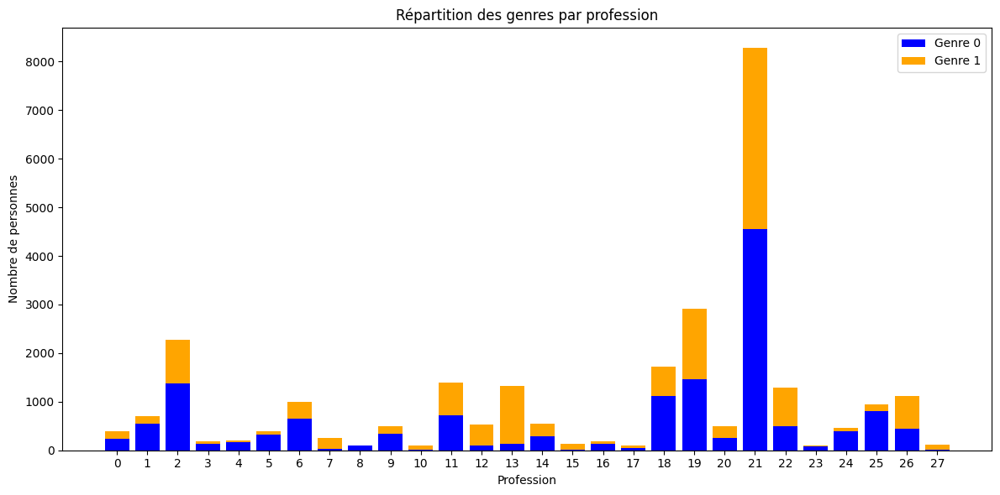

In [6]:
# Initialiser un dictionnaire pour stocker les comptes de chaque profession pour chaque genre
counts_by_profession = {}

# Compter le nombre de valeurs par profession et par genre
for profession, genre in zip(Y, S):
    if profession not in counts_by_profession:
        counts_by_profession[profession] = [0, 0]  # Initialiser le compteur pour cette profession
    counts_by_profession[profession][genre] += 1  # Incrémenter le compteur correspondant au genre

# Trier la liste des professions par classe de profession
sorted_counts_by_profession = sorted(counts_by_profession.items(), key=lambda x: x[0])

# Afficher le nombre de valeurs par profession et par genre
print("Distribution des professions et genres [0, 1]:")
print("En \033[91mrouge\033[0m les distributions de genre dont le déséquilibre dépasse les 70/30")
for profession, counts in sorted_counts_by_profession:
    if counts[0]/(counts[0]+counts[1]) >= 0.3 and counts[0]/(counts[0]+counts[1]) <= 0.7:
        print(f"Profession {profession}: {counts[0]+counts[1]} [{counts[0]}, {counts[1]}]")
    else:
        print(f"Profession {profession}: {counts[0]+counts[1]} [\033[91m{counts[0]}\033[0m, \033[91m{counts[1]}\033[0m]")
        
# Tracer l'histogramme des professions avec la répartition des genres
plt.figure(figsize=(12, 6))
for profession, counts in sorted_counts_by_profession:
    plt.bar(profession, counts[0], color='blue', label='Genre 0')
    plt.bar(profession, counts[1], bottom=counts[0], color='orange', label='Genre 1')

plt.title('Répartition des genres par profession')
plt.xlabel('Profession')
plt.ylabel('Nombre de personnes')
plt.legend(['Genre 0', 'Genre 1'])
plt.xticks(range(28))
plt.tight_layout()
plt.show()
        

In [4]:
# Séparation des données pour l'entraînement des modèles
# test final pour évaluer la perfo de l'algo complet
X_train, X_test_final, Y_train, Y_test_final, S_train, S_test_final = train_test_split(X, Y, S, test_size=0.2, random_state=42)
# test pour évaluer la perfo des modèles
X_train, X_test, Y_train, Y_test, S_train, S_test = train_test_split(X_train, Y_train, S_train, test_size=0.2, random_state=42)

In [21]:
labels_tries = Y.value_counts().sort_values(ascending=False).index.tolist()
print("Labels classés par ordre décroissant d'occurrence:")
print(labels_tries)

labels_tries_2 = Y.value_counts().sort_values(ascending=True).index.tolist()
print("Labels classés par ordre croissant d'occurrence:")
print(labels_tries_2)


Labels classés par ordre décroissant d'occurrence:
[21, 19, 2, 18, 11, 13, 22, 26, 6, 25, 1, 14, 12, 20, 9, 24, 0, 5, 7, 4, 3, 16, 15, 27, 8, 17, 10, 23]
Labels classés par ordre croissant d'occurrence:
[23, 10, 17, 8, 27, 15, 16, 3, 4, 7, 5, 0, 24, 9, 20, 12, 14, 1, 25, 6, 26, 22, 13, 11, 18, 2, 19, 21]


## Classifieur binaire

Classification binaire de la profession: 23
Profession: 23
0.5982174463566476 0.8328250310629166 0.36360986165037856
2
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4429
           1       0.56      0.82      0.67        11

    accuracy                           1.00      4440
   macro avg       0.78      0.91      0.83      4440
weighted avg       1.00      1.00      1.00      4440



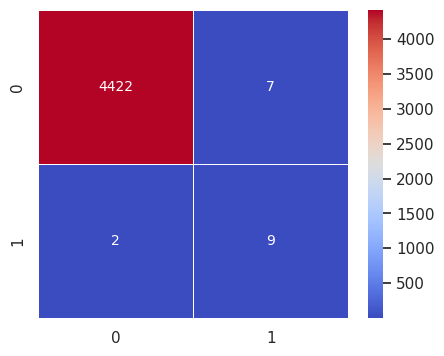



Classification binaire de la profession: 10
Profession: 10
0.7818574328210612 0.7846934145709099 0.7790214510712126
2
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4412
           1       0.48      0.71      0.57        17

    accuracy                           1.00      4429
   macro avg       0.74      0.85      0.78      4429
weighted avg       1.00      1.00      1.00      4429



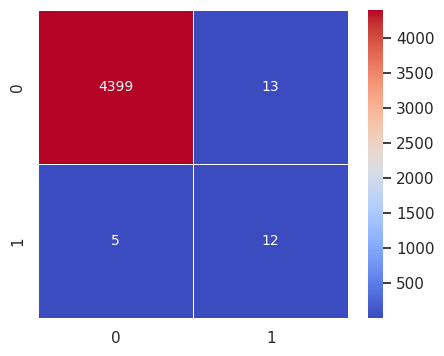



Classification binaire de la profession: 17
Profession: 17
0.7931949147151227 0.6924679822292659 0.8939218472009797
2
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4403
           1       0.27      0.67      0.39         9

    accuracy                           1.00      4412
   macro avg       0.64      0.83      0.69      4412
weighted avg       1.00      1.00      1.00      4412



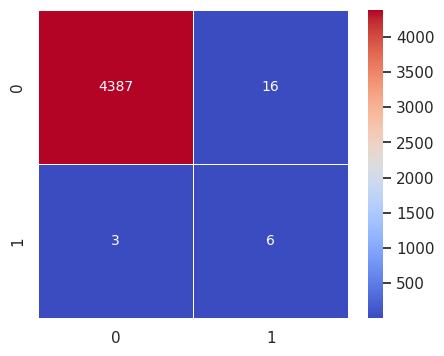



Classification binaire de la profession: 8
Profession: 8
0.8999352772726286 0.8470270001985309 0.9528435543467262
2
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4386
           1       0.55      0.94      0.70        17

    accuracy                           1.00      4403
   macro avg       0.78      0.97      0.85      4403
weighted avg       1.00      1.00      1.00      4403



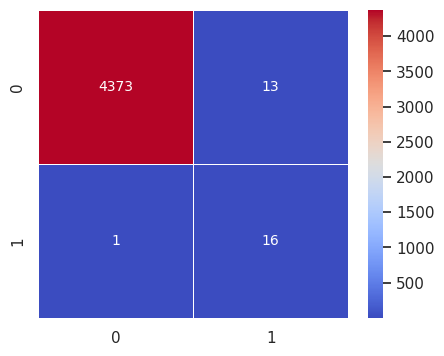



Classification binaire de la profession: 27
Profession: 27
0.7681587050637346 0.7485091743119265 0.7878082358155428
2
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      4369
           1       0.37      0.76      0.50        17

    accuracy                           0.99      4386
   macro avg       0.69      0.88      0.75      4386
weighted avg       1.00      0.99      1.00      4386



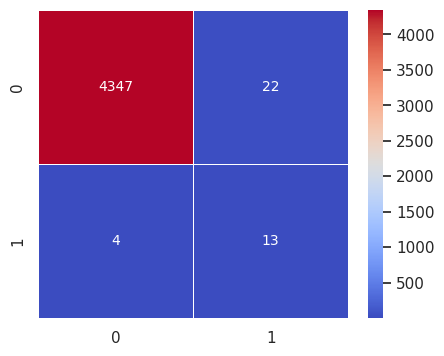



Classification binaire de la profession: 15
Profession: 15
0.7954716086972533 0.7089023119912506 0.8820409054032559
2
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      4346
           1       0.31      0.65      0.42        23

    accuracy                           0.99      4369
   macro avg       0.66      0.82      0.71      4369
weighted avg       0.99      0.99      0.99      4369



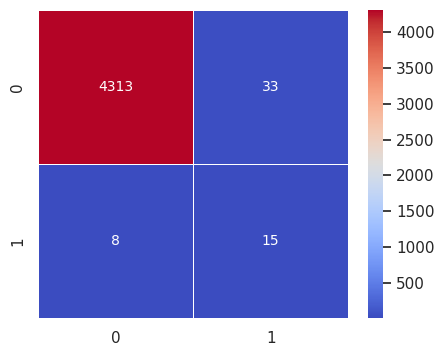



Classification binaire de la profession: 16
Profession: 16
0.7752685965656108 0.6715928104927944 0.878944382638427
2
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      4319
           1       0.24      0.63      0.35        27

    accuracy                           0.99      4346
   macro avg       0.62      0.81      0.67      4346
weighted avg       0.99      0.99      0.99      4346



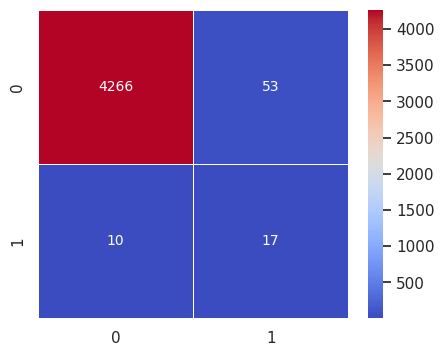



Classification binaire de la profession: 3
Profession: 3
0.6446151364885955 0.6624462680734662 0.6267840049037248
2
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      4285
           1       0.24      0.53      0.33        34

    accuracy                           0.98      4319
   macro avg       0.62      0.76      0.66      4319
weighted avg       0.99      0.98      0.99      4319



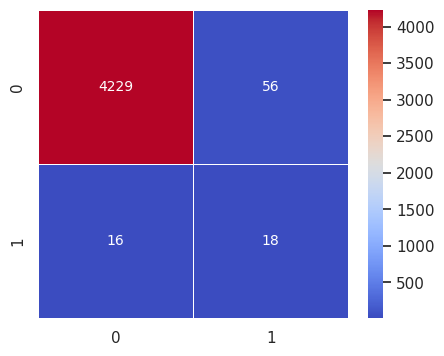



Classification binaire de la profession: 4
Profession: 4
0.8192841466332826 0.8230857803446995 0.8154825129218658
2
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4254
           1       0.54      0.81      0.65        31

    accuracy                           0.99      4285
   macro avg       0.77      0.90      0.82      4285
weighted avg       1.00      0.99      0.99      4285



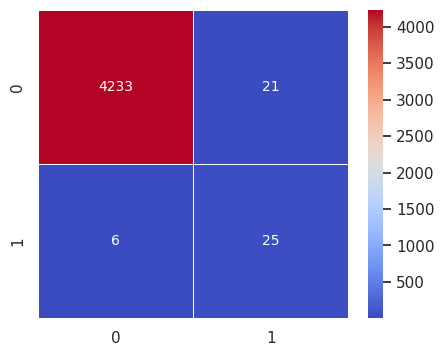



Classification binaire de la profession: 7
Profession: 7
0.7873393665139246 0.8070788498615583 0.7675998831662907
2
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      4217
           1       0.50      0.81      0.62        37

    accuracy                           0.99      4254
   macro avg       0.75      0.90      0.81      4254
weighted avg       0.99      0.99      0.99      4254



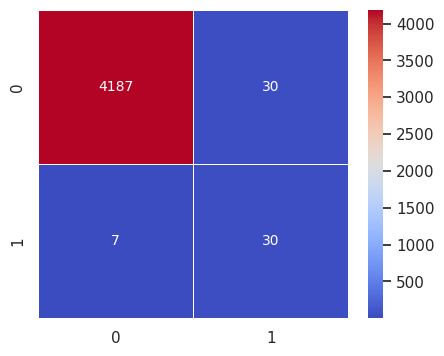



Classification binaire de la profession: 5
Profession: 5
0.837487504450904 0.8710686696153767 0.8039063392864314
2
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      4155
           1       0.66      0.85      0.75        62

    accuracy                           0.99      4217
   macro avg       0.83      0.92      0.87      4217
weighted avg       0.99      0.99      0.99      4217



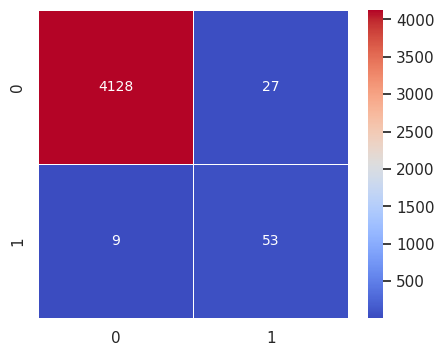



Classification binaire de la profession: 0
Profession: 0
0.8578700293553635 0.727918136000788 0.987821922709939
2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      4087
           1       0.34      0.75      0.47        68

    accuracy                           0.97      4155
   macro avg       0.67      0.86      0.73      4155
weighted avg       0.99      0.97      0.98      4155



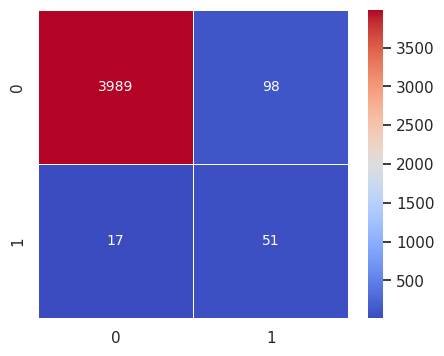



Classification binaire de la profession: 24
Profession: 24
0.7823312125307833 0.7276446856830805 0.8370177393784862
2
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      4015
           1       0.35      0.69      0.47        72

    accuracy                           0.97      4087
   macro avg       0.67      0.84      0.73      4087
weighted avg       0.98      0.97      0.98      4087



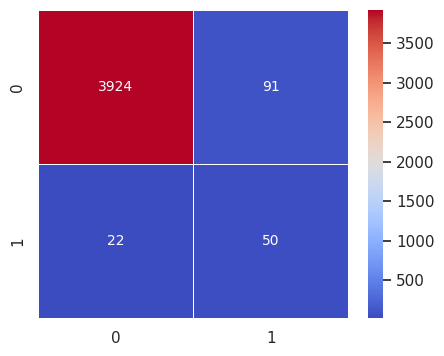



Classification binaire de la profession: 9
Profession: 9
0.9211372350208555 0.8490601503759398 0.9932143196657711
2
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      3939
           1       0.59      0.88      0.71        76

    accuracy                           0.99      4015
   macro avg       0.79      0.93      0.85      4015
weighted avg       0.99      0.99      0.99      4015



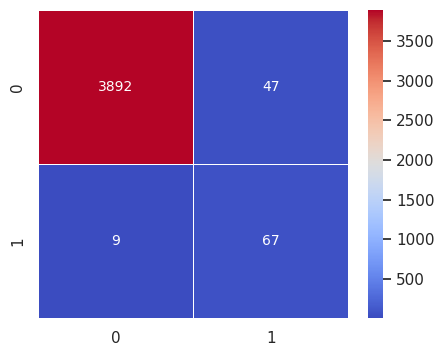



Classification binaire de la profession: 20
Profession: 20
0.9005341163791138 0.8063427706071762 0.9947254621510514
2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3857
           1       0.50      0.82      0.62        82

    accuracy                           0.98      3939
   macro avg       0.75      0.90      0.81      3939
weighted avg       0.99      0.98      0.98      3939



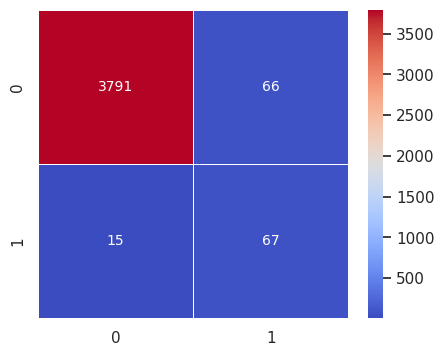



Classification binaire de la profession: 12
Profession: 12
0.7815742797406238 0.828394732158747 0.7347538273225006
2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3767
           1       0.56      0.82      0.67        90

    accuracy                           0.98      3857
   macro avg       0.78      0.90      0.83      3857
weighted avg       0.99      0.98      0.98      3857



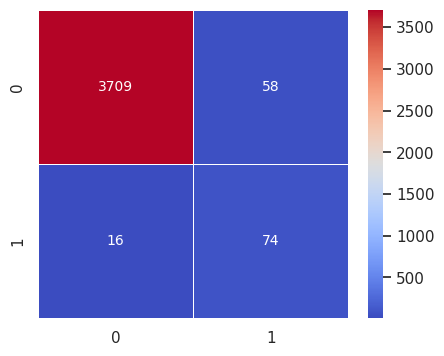



Classification binaire de la profession: 14
Profession: 14
0.8869078530535133 0.8253833397099327 0.9484323663970937
2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3694
           1       0.52      0.89      0.66        73

    accuracy                           0.98      3767
   macro avg       0.76      0.94      0.83      3767
weighted avg       0.99      0.98      0.98      3767



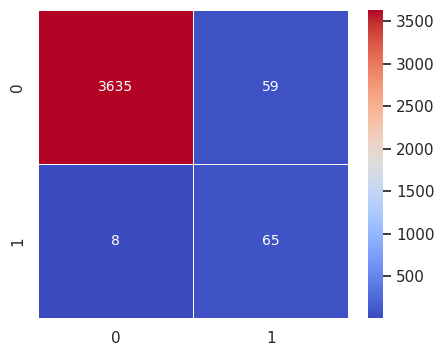



Classification binaire de la profession: 1
Profession: 1
0.881210948496444 0.8397686854088335 0.9226532115840544
2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3571
           1       0.58      0.86      0.69       123

    accuracy                           0.97      3694
   macro avg       0.79      0.92      0.84      3694
weighted avg       0.98      0.97      0.98      3694



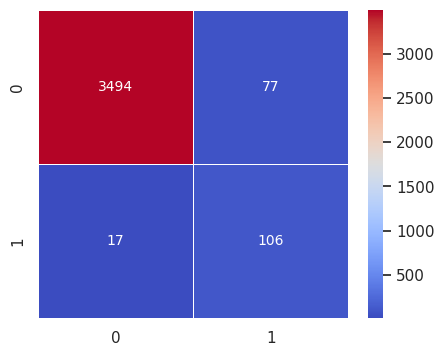



Classification binaire de la profession: 25
Profession: 25
0.7683724762456444 0.7313739440841373 0.8053710084071516
2
              precision    recall  f1-score   support

           0       0.99      0.94      0.97      3428
           1       0.36      0.78      0.50       143

    accuracy                           0.94      3571
   macro avg       0.68      0.86      0.73      3571
weighted avg       0.97      0.94      0.95      3571



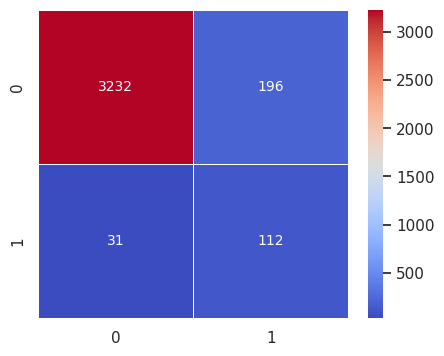



Classification binaire de la profession: 6
Profession: 6
0.950138719611316 0.935787318034518 0.9644901211881142
2
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      3260
           1       0.84      0.92      0.88       168

    accuracy                           0.99      3428
   macro avg       0.92      0.96      0.94      3428
weighted avg       0.99      0.99      0.99      3428



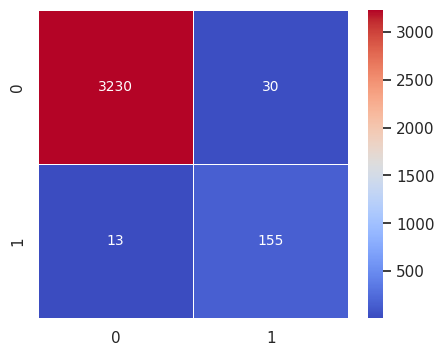



Classification binaire de la profession: 26
Profession: 26
0.8370622802326734 0.7056528907812151 0.9684716696841317
2
              precision    recall  f1-score   support

           0       0.98      0.93      0.95      3068
           1       0.35      0.66      0.46       192

    accuracy                           0.91      3260
   macro avg       0.67      0.79      0.71      3260
weighted avg       0.94      0.91      0.92      3260



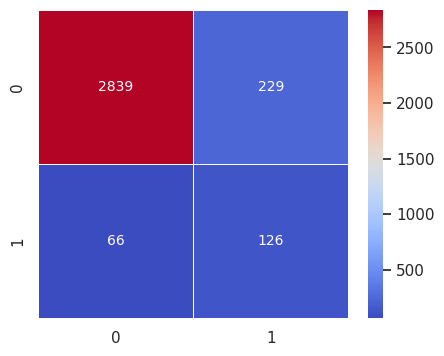



Classification binaire de la profession: 22
Profession: 22
0.8546786682671412 0.7751316486812581 0.9342256878530243
2
              precision    recall  f1-score   support

           0       0.98      0.93      0.96      2854
           1       0.47      0.79      0.59       214

    accuracy                           0.92      3068
   macro avg       0.73      0.86      0.78      3068
weighted avg       0.95      0.92      0.93      3068



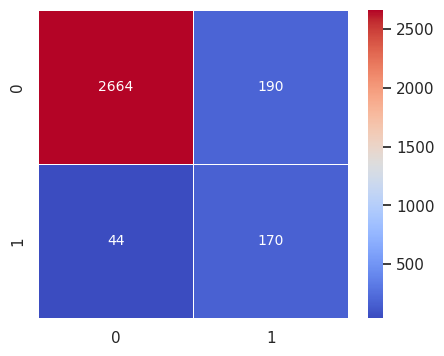



Classification binaire de la profession: 13
Profession: 13
0.8904072073022278 0.8324133881385791 0.9484010264658763
2
              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2667
           1       0.58      0.87      0.69       187

    accuracy                           0.95      2854
   macro avg       0.78      0.91      0.83      2854
weighted avg       0.96      0.95      0.95      2854



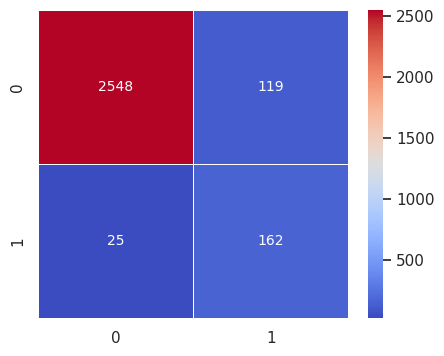



Classification binaire de la profession: 11
Profession: 11
0.8960694117148065 0.8389279243448672 0.9532108990847458
2
              precision    recall  f1-score   support

           0       0.98      0.95      0.97      2426
           1       0.62      0.84      0.71       241

    accuracy                           0.94      2667
   macro avg       0.80      0.90      0.84      2667
weighted avg       0.95      0.94      0.94      2667



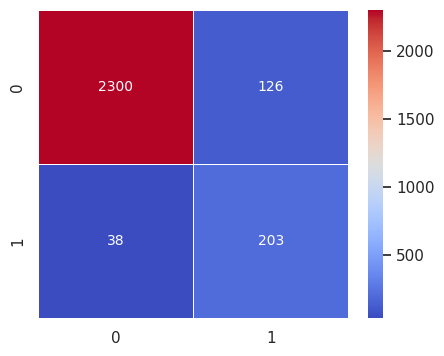



Classification binaire de la profession: 18
Profession: 18
0.9629208223510163 0.9463336076380593 0.9795080370639733
2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      2181
           1       0.85      0.96      0.90       245

    accuracy                           0.98      2426
   macro avg       0.92      0.97      0.95      2426
weighted avg       0.98      0.98      0.98      2426



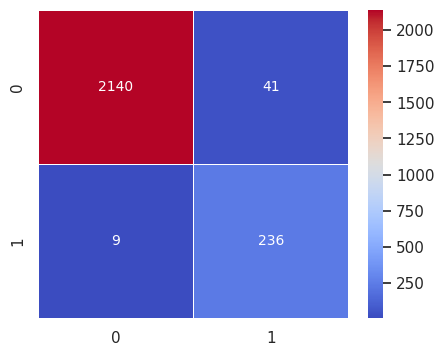



Classification binaire de la profession: 2
Profession: 2
0.9742541344519864 0.9574183611488734 0.9910899077550994
2
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1804
           1       0.91      0.95      0.93       377

    accuracy                           0.98      2181
   macro avg       0.95      0.97      0.96      2181
weighted avg       0.98      0.98      0.98      2181



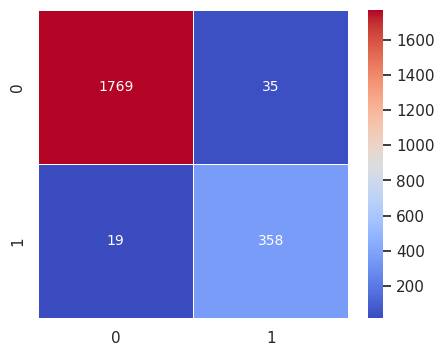



Classification binaire de la profession: 19
Profession: 19
0.9587631114799151 0.9425560595762112 0.9749701633836191
2
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1332
           1       0.90      0.93      0.92       472

    accuracy                           0.96      1804
   macro avg       0.94      0.95      0.94      1804
weighted avg       0.96      0.96      0.96      1804



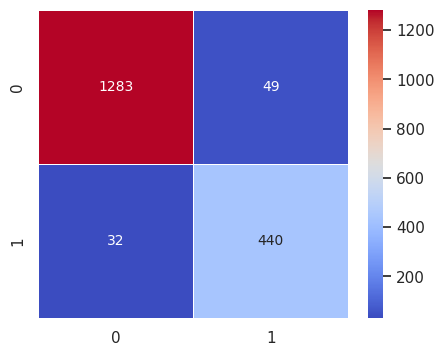

In [22]:
#X = dat['X_train']
#Y = dat['Y']
#S = dat['S_train']

# Séparation des données pour l'entraînement des modèles
# test final pour évaluer la perfo de l'algo complet
X_train, X_test_final, Y_train, Y_test_final, S_train, S_test_final = train_test_split(X, Y, S, test_size=0.2, random_state=42)
# test pour évaluer la perfo des modèles
X_train, X_test, Y_train, Y_test, S_train, S_test = train_test_split(X_train, Y_train, S_train, test_size=0.2, random_state=42)


clf_list = []
performance = []

for i in labels_tries_2[:-1]:
    
    print(f"Classification binaire de la profession: {i}")
    
    # copie des données
    Y_train_temp = Y_train.copy()
    Y_test_temp = Y_test.copy()
    
    # binarisation des labels
    Y_train_temp[Y_train == i] = 1
    Y_train_temp[Y_train != i] = 0
    Y_test_temp[Y_test == i] = 1
    Y_test_temp[Y_test != i] = 0
    
    # entrainement du modèle
    weight_positive = len(Y_train_temp) / (2 * np.sum(Y_train_temp))
    weight_negative = len(Y_train_temp) / (2 * (len(Y_train_temp) - np.sum(Y_train_temp))) 
    clf = LogisticRegression(random_state=0, max_iter=5000, class_weight={0: weight_negative, 1: weight_positive}).fit(X_train, Y_train_temp)
    
    # prédiction
    Y_pred = clf.predict(X_test)
    
    # évaluation
    print(f"Profession: {i}")
    eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred, Y_test_temp, S_test, metrics=['TPR'])
    final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
    print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))
    performance.append(final_score)

    names = [str(x) for x in set(Y_test_temp)]
    print(len(names))
    print(classification_report(Y_test_temp, Y_pred, target_names=names))

    cm = confusion_matrix(Y_test_temp, Y_pred)
    df_cm = pd.DataFrame(cm, index=names, columns=names)
    plt.figure(figsize=(5,4))
    sn.set(font_scale=1)
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
    plt.show()
    print("\n")
    
    # sauvegarde du modèle
    clf_list.append(clf)
    
    # suppression de la classe i
    X_train = X_train[Y_train != i]
    S_train = S_train[Y_train != i]
    Y_train = Y_train[Y_train != i]
    X_test = X_test[Y_test != i]
    S_test = S_test[Y_test != i]
    Y_test = Y_test[Y_test != i]
    
    

Classification binaire de la profession: 23
Profession: 23
0.6977529093293 0.4148655772272008 0.9806402414313992
2
              precision    recall  f1-score   support

           0       1.00      0.71      0.83      5534
           1       0.00      0.00      0.00        16

    accuracy                           0.71      5550
   macro avg       0.50      0.36      0.41      5550
weighted avg       0.99      0.71      0.83      5550



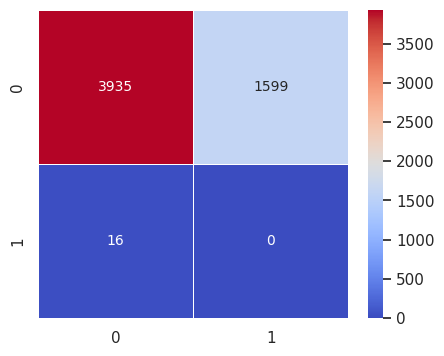



Classification binaire de la profession: 10
Profession: 10
0.7169194257895036 0.45935960591133007 0.9744792456676772
2
              precision    recall  f1-score   support

           0       0.99      0.85      0.92      3929
           1       0.00      0.00      0.00        22

    accuracy                           0.85      3951
   macro avg       0.50      0.43      0.46      3951
weighted avg       0.99      0.85      0.91      3951



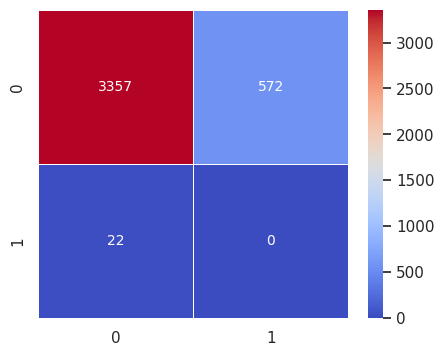



Classification binaire de la profession: 17
Profession: 17
0.7075144470332325 0.465633371287755 0.9493955227787101
2
              precision    recall  f1-score   support

           0       0.99      0.87      0.93      3353
           1       0.00      0.04      0.00        26

    accuracy                           0.86      3379
   macro avg       0.50      0.45      0.47      3379
weighted avg       0.98      0.86      0.92      3379



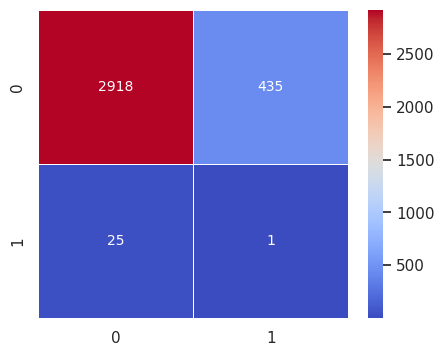



Classification binaire de la profession: 8
Profession: 8
0.7072481201991416 0.4685133312584293 0.9459829091398538
2
              precision    recall  f1-score   support

           0       0.99      0.88      0.93      2925
           1       0.00      0.06      0.01        18

    accuracy                           0.87      2943
   macro avg       0.50      0.47      0.47      2943
weighted avg       0.99      0.87      0.93      2943



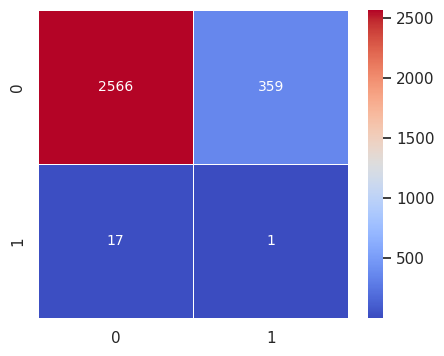



Classification binaire de la profession: 27
Profession: 27
0.7319908766932022 0.4714548802946593 0.992526873091745
2
              precision    recall  f1-score   support

           0       0.99      0.90      0.94      2569
           1       0.00      0.00      0.00        14

    accuracy                           0.89      2583
   macro avg       0.50      0.45      0.47      2583
weighted avg       0.99      0.89      0.94      2583



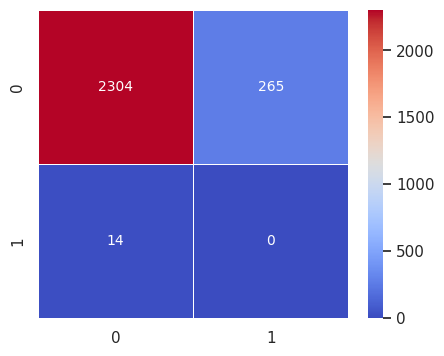



Classification binaire de la profession: 15
Profession: 15
0.5418952629063775 0.467003908944585 0.6167866168681699
2
              precision    recall  f1-score   support

           0       1.00      0.88      0.93      2310
           1       0.00      0.00      0.00         8

    accuracy                           0.88      2318
   macro avg       0.50      0.44      0.47      2318
weighted avg       0.99      0.88      0.93      2318



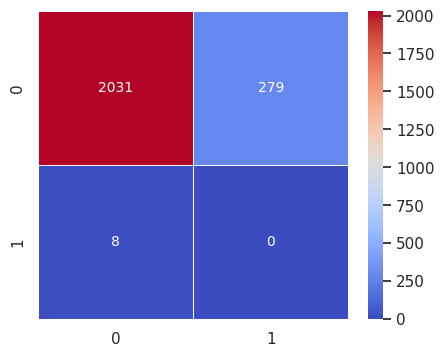



Classification binaire de la profession: 16
Profession: 16
0.6707365397783458 0.4786436137830269 0.8628294657736646
2
              precision    recall  f1-score   support

           0       0.99      0.89      0.93      2014
           1       0.01      0.12      0.02        25

    accuracy                           0.88      2039
   macro avg       0.50      0.50      0.48      2039
weighted avg       0.98      0.88      0.92      2039



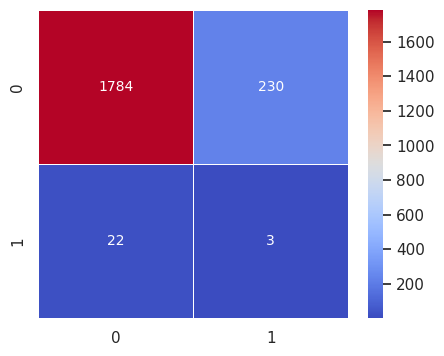



Classification binaire de la profession: 3
Profession: 3
0.6885839001592569 0.46922835524251194 0.9079394450760019
2
              precision    recall  f1-score   support

           0       0.99      0.88      0.93      1783
           1       0.00      0.04      0.01        23

    accuracy                           0.87      1806
   macro avg       0.50      0.46      0.47      1806
weighted avg       0.97      0.87      0.92      1806



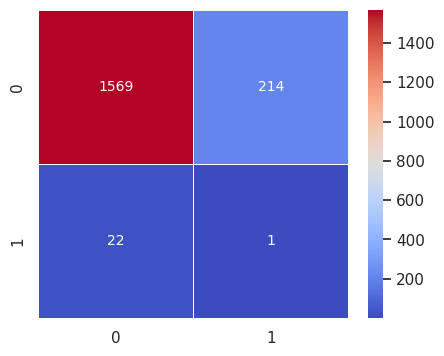



Classification binaire de la profession: 4
Profession: 4
0.7273472514853244 0.46286293045239707 0.9918315725182517
2
              precision    recall  f1-score   support

           0       0.97      0.88      0.93      1550
           1       0.00      0.00      0.00        41

    accuracy                           0.86      1591
   macro avg       0.49      0.44      0.46      1591
weighted avg       0.95      0.86      0.90      1591



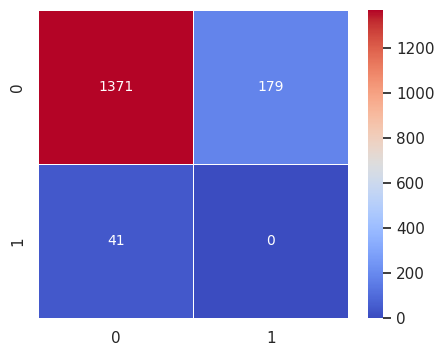



Classification binaire de la profession: 7
Profession: 7
0.6808282055790105 0.45398298530549114 0.9076734258525297
2
              precision    recall  f1-score   support

           0       0.96      0.86      0.91      1367
           1       0.00      0.00      0.00        45

    accuracy                           0.83      1412
   macro avg       0.48      0.43      0.45      1412
weighted avg       0.93      0.83      0.88      1412



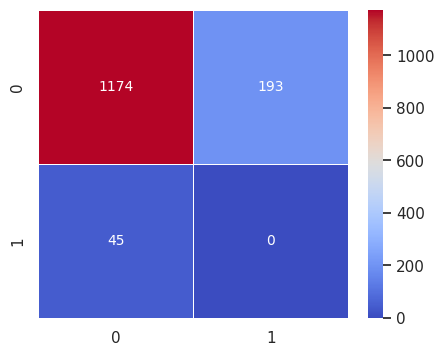



Classification binaire de la profession: 5
Profession: 5
0.7026788083221749 0.4685740229120072 0.9367835937323424
2
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      1156
           1       0.01      0.02      0.01        63

    accuracy                           0.86      1219
   macro avg       0.48      0.46      0.47      1219
weighted avg       0.90      0.86      0.88      1219



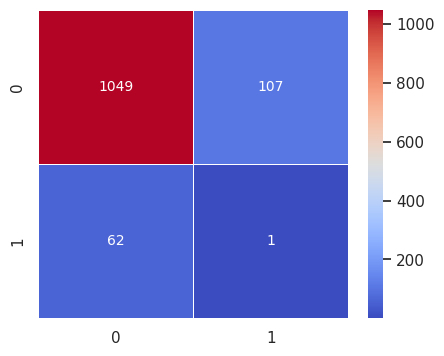



Classification binaire de la profession: 0
Profession: 0
0.7249684484780508 0.45963035019455256 0.990306546761549
2
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1053
           1       0.00      0.00      0.00        58

    accuracy                           0.85      1111
   macro avg       0.47      0.45      0.46      1111
weighted avg       0.89      0.85      0.87      1111



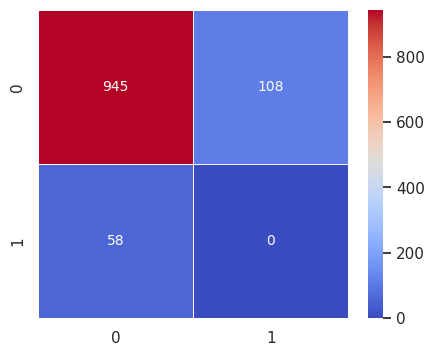



Classification binaire de la profession: 24
Profession: 24
0.661791276640576 0.46478863478863475 0.8587939184925174
2
              precision    recall  f1-score   support

           0       0.94      0.89      0.92       952
           1       0.01      0.02      0.01        51

    accuracy                           0.85      1003
   macro avg       0.48      0.46      0.46      1003
weighted avg       0.90      0.85      0.87      1003



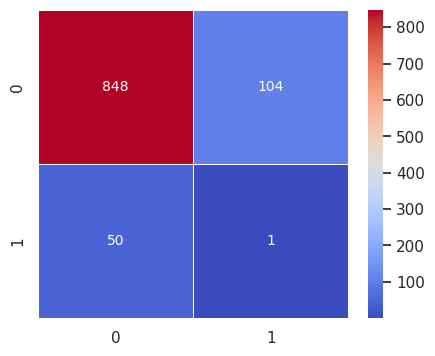



Classification binaire de la profession: 9
Profession: 9
0.700124138061878 0.4506061916430437 0.9496420844807123
2
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       821
           1       0.02      0.03      0.02        77

    accuracy                           0.79       898
   macro avg       0.46      0.44      0.45       898
weighted avg       0.83      0.79      0.81       898



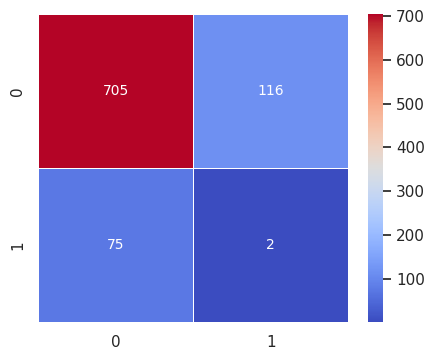



Classification binaire de la profession: 20
Profession: 20
0.7286783495067546 0.466484268125855 0.9908724308876543
2
              precision    recall  f1-score   support

           0       0.99      0.88      0.93       773
           1       0.00      0.00      0.00         7

    accuracy                           0.87       780
   macro avg       0.49      0.44      0.47       780
weighted avg       0.98      0.87      0.92       780



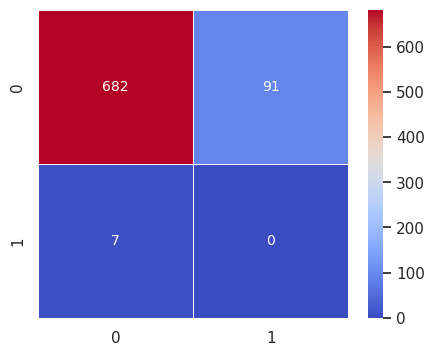



Classification binaire de la profession: 12
Profession: 12
0.6837697006746182 0.4553359683794466 0.9122034329697898
2
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       672
           1       0.00      0.00      0.00        17

    accuracy                           0.84       689
   macro avg       0.49      0.43      0.46       689
weighted avg       0.95      0.84      0.89       689



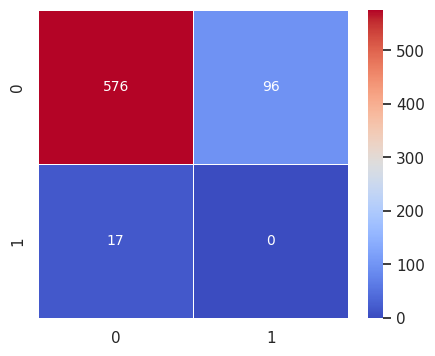



Classification binaire de la profession: 14
Profession: 14
0.613576603876769 0.46729740061162084 0.7598558071419172
2
              precision    recall  f1-score   support

           0       0.99      0.85      0.91       586
           1       0.01      0.14      0.02         7

    accuracy                           0.84       593
   macro avg       0.50      0.50      0.47       593
weighted avg       0.98      0.84      0.90       593



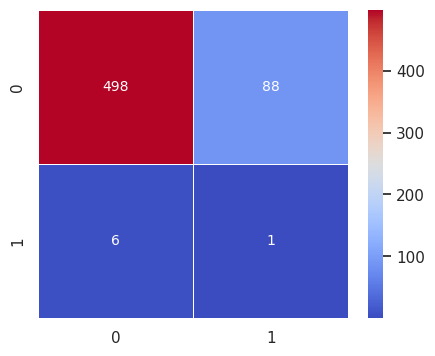



Classification binaire de la profession: 1
Profession: 1
0.679156641958512 0.45631067961165045 0.9020026043053735
2
              precision    recall  f1-score   support

           0       0.98      0.85      0.91       496
           1       0.00      0.00      0.00         8

    accuracy                           0.84       504
   macro avg       0.49      0.43      0.46       504
weighted avg       0.97      0.84      0.90       504



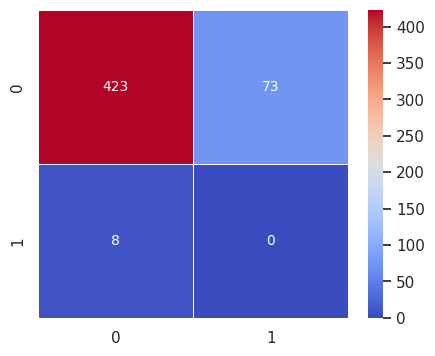



Classification binaire de la profession: 25
Profession: 25
0.5422324411969727 0.4679012345679013 0.6165636478260441
2
              precision    recall  f1-score   support

           0       0.99      0.89      0.94       428
           1       0.00      0.00      0.00         3

    accuracy                           0.88       431
   macro avg       0.50      0.44      0.47       431
weighted avg       0.99      0.88      0.93       431



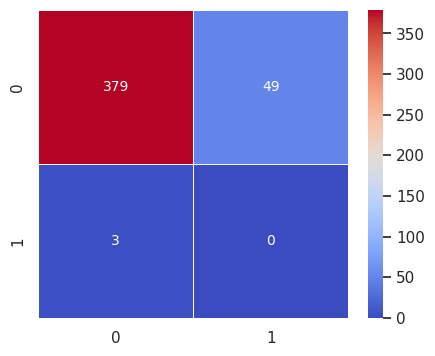



Classification binaire de la profession: 6
Profession: 6
0.6877750177763984 0.45892351274787535 0.9166265228049214
2
              precision    recall  f1-score   support

           0       0.98      0.86      0.92       376
           1       0.00      0.00      0.00         6

    accuracy                           0.85       382
   macro avg       0.49      0.43      0.46       382
weighted avg       0.97      0.85      0.90       382



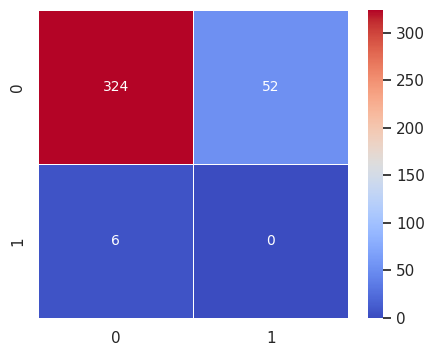



Classification binaire de la profession: 26
Profession: 26
0.6614872081443461 0.46206714247951364 0.8609072738091785
2
              precision    recall  f1-score   support

           0       0.91      0.84      0.87       303
           1       0.04      0.07      0.05        27

    accuracy                           0.78       330
   macro avg       0.47      0.46      0.46       330
weighted avg       0.84      0.78      0.81       330



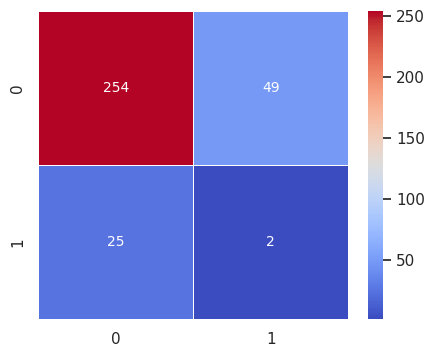



Classification binaire de la profession: 22
Profession: 22
0.5615990690575609 0.5212732429877087 0.601924895127413
2
              precision    recall  f1-score   support

           0       0.98      0.84      0.90       270
           1       0.08      0.44      0.14         9

    accuracy                           0.82       279
   macro avg       0.53      0.64      0.52       279
weighted avg       0.95      0.82      0.88       279



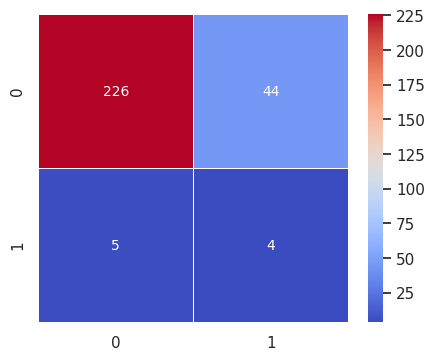



Classification binaire de la profession: 13
Profession: 13
0.5543105520534395 0.46403712296983757 0.6445839811370413
2
              precision    recall  f1-score   support

           0       0.97      0.89      0.93       225
           1       0.00      0.00      0.00         6

    accuracy                           0.87       231
   macro avg       0.49      0.44      0.46       231
weighted avg       0.95      0.87      0.90       231



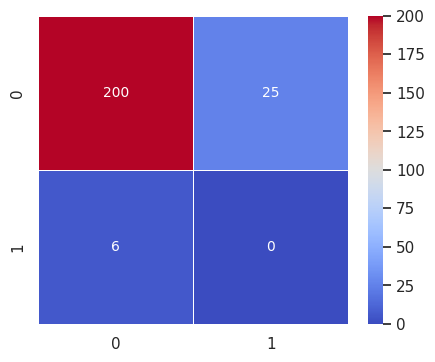



Classification binaire de la profession: 11
Profession: 11
0.6303701489702602 0.430939226519337 0.8298010714211834
2
              precision    recall  f1-score   support

           0       0.89      0.84      0.86       186
           1       0.00      0.00      0.00        20

    accuracy                           0.76       206
   macro avg       0.44      0.42      0.43       206
weighted avg       0.80      0.76      0.78       206



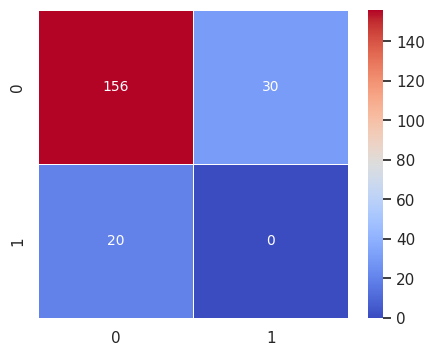



Classification binaire de la profession: 18
Profession: 18
0.6710224583781216 0.5169006352442945 0.8251442815119486
2
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       162
           1       0.11      0.21      0.15        14

    accuracy                           0.80       176
   macro avg       0.52      0.53      0.52       176
weighted avg       0.86      0.80      0.83       176



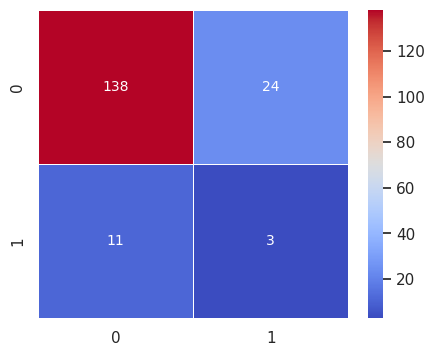



Classification binaire de la profession: 2
Profession: 2
0.576430501991944 0.4440739858696515 0.7087870181142365
2
              precision    recall  f1-score   support

           0       0.93      0.71      0.81       140
           1       0.05      0.22      0.08         9

    accuracy                           0.68       149
   macro avg       0.49      0.47      0.44       149
weighted avg       0.88      0.68      0.77       149



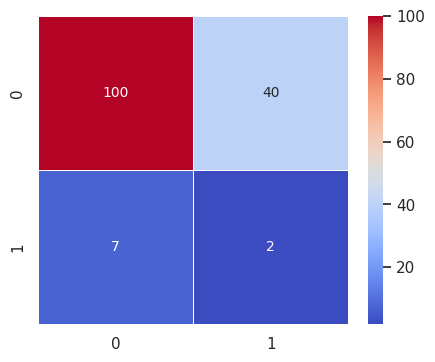



Classification binaire de la profession: 19
Profession: 19
0.6335610297121657 0.2671232876712329 0.9999987717530984
1


ValueError: Number of classes, 2, does not match size of target_names, 1. Try specifying the labels parameter

In [28]:
performance_finale = []
# Y_pred_final = np.full_like(Y_test_final, labels_tries[-1])
Y_pred_final = []

X_test_final_temp = X_test_final.copy()
S_test_final_temp = S_test_final.copy()
Y_test_final_temp = Y_test_final.copy()

# évaluation de l'algo complet sur le test final
for i, classe in enumerate(labels_tries_2[:-1]):
    
    print(f"Classification binaire de la profession: {classe}")
    
    # copie des données
    Y_test_final_temp_bin = Y_test_final_temp.copy()
    
    # binarisation des labels
    Y_test_final_temp_bin[Y_test_final_temp == classe] = 1
    Y_test_final_temp_bin[Y_test_final_temp != classe] = 0
    
    # prédiction
    Y_pred = clf_list[i].predict(X_test_final_temp)
    
    # évaluation
    print(f"Profession: {classe}")
    eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred, Y_test_final_temp_bin, S_test_final_temp, metrics=['TPR'])
    final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
    print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))
    performance_finale.append(final_score)

    names = [str(x) for x in set(Y_test_final_temp_bin)]
    print(len(names))
    print(classification_report(Y_test_final_temp_bin, Y_pred, target_names=names))

    cm = confusion_matrix(Y_test_final_temp_bin, Y_pred)
    df_cm = pd.DataFrame(cm, index=names, columns=names)
    plt.figure(figsize=(5,4))
    sn.set(font_scale=1)
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
    plt.show()
    print("\n")
    
    # suppression de la classe i
    Y_pred[Y_pred == 1] = classe + 100
    Y_pred_final.append(Y_pred)
    X_test_final_temp = X_test_final_temp[Y_pred == 0]
    S_test_final_temp = S_test_final_temp[Y_pred == 0]
    Y_test_final_temp = Y_test_final_temp[Y_pred == 0]
    
    

In [29]:
print(len(Y_pred_final))
for i in range(len(Y_pred_final)):
    print(Y_pred_final[i])

Y_final = np.zeros(len(Y_test_final))
for i in range(len(Y_pred_final)):
    Y_final[Y_final == 0] = Y_pred_final[i]

Y_final[Y_final == 0] = labels_tries_2[-1] + 100
Y_100 = np.full_like(Y_final, 100)
Y_final = Y_final - 100

print(Y_final[:10])


26
[  0 123   0 ...   0   0   0]
[0 0 0 ... 0 0 0]
[  0 117   0 ...   0   0   0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[  0   0   0 ...   0 115   0]
[0 0 0 ... 0 0 0]
[  0   0   0 ... 103   0 103]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[  0   0 109 109   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0 109 109   0   0   0   0   0   0   0   0   0   0   0 109   0   0
   0   0   0   0   0   0 109   0   0   0   0   0   0 109   0   0   0 109
   0   0   0   0   0   0   0   0   0 109   0   0   0   0   0   0 109   0
   0 109   0   0   0   0   0   0   0   0   0   0   0 109   0 109   0   0
   0   0   0   0   0   0   0 109   0   0   0   0   0 109   0 109   0 109
   0   0   0   0   0   0 109   0   0   0   0   0   0 109   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0 109   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0  

0.6819473322841143 0.5836348492020542 0.7802598153661744
28
              precision    recall  f1-score   support

           0       0.37      0.64      0.47        81
           1       0.46      0.42      0.44       127
           2       0.86      0.71      0.78       458
           3       0.33      0.61      0.43        36
           4       0.60      0.67      0.63        48
           5       0.76      0.83      0.79        72
           6       0.80      0.68      0.74       178
           7       0.63      0.76      0.69        54
           8       0.35      0.44      0.39        18
           9       0.57      0.76      0.65        91
          10       0.31      0.55      0.39        22
          11       0.61      0.54      0.57       286
          12       0.58      0.65      0.62       110
          13       0.73      0.76      0.74       258
          14       0.56      0.73      0.64       112
          15       0.18      0.47      0.26        19
          16       0.

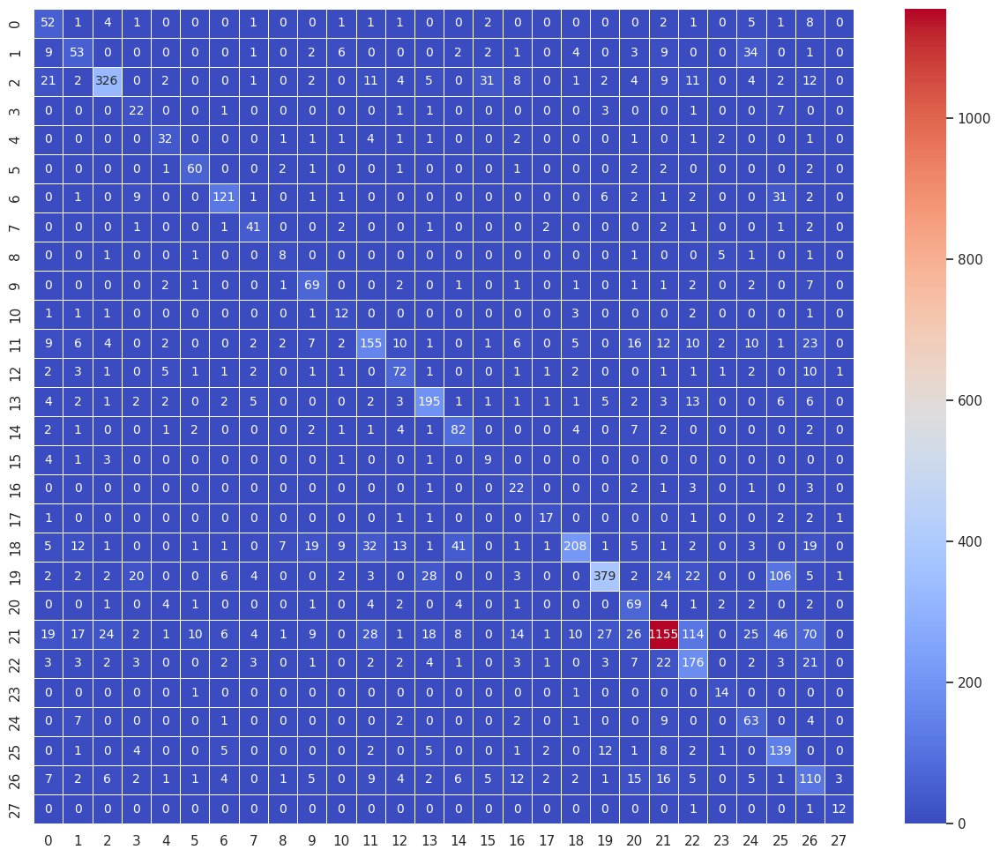

In [25]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_final, Y_test_final, S_test_final, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))
performance_finale.append(final_score)

names = [str(x) for x in set(Y_test_final)]
print(len(names))
print(classification_report(Y_test_final, Y_final, target_names=names))

cm = confusion_matrix(Y_test_final, Y_final)
df_cm = pd.DataFrame(cm, index=names, columns=names)
plt.figure(figsize=(15,12))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()
print("\n")

Classification binaire de la profession: 21
Profession: 21
0.9465209261741117 0.8985709133575517 0.9944709389906715
2
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3108
           1       0.87      0.85      0.86      1332

    accuracy                           0.92      4440
   macro avg       0.90      0.90      0.90      4440
weighted avg       0.91      0.92      0.92      4440



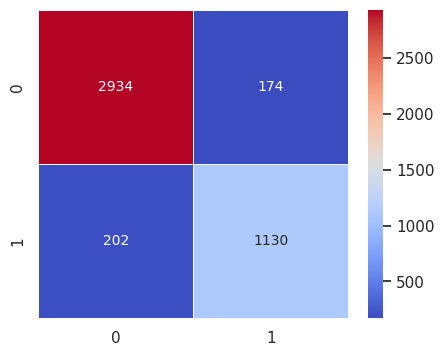



Classification binaire de la profession: 19
Profession: 19
0.9065254016160238 0.8835074609265767 0.9295433423054708
2
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2636
           1       0.85      0.76      0.80       472

    accuracy                           0.94      3108
   macro avg       0.90      0.87      0.88      3108
weighted avg       0.94      0.94      0.94      3108



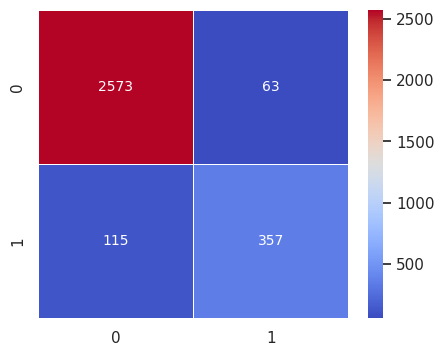



Classification binaire de la profession: 2
Profession: 2
0.9441231644850365 0.9018770747900801 0.9863692541799929
2
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      2259
           1       0.87      0.79      0.83       377

    accuracy                           0.95      2636
   macro avg       0.92      0.89      0.90      2636
weighted avg       0.95      0.95      0.95      2636



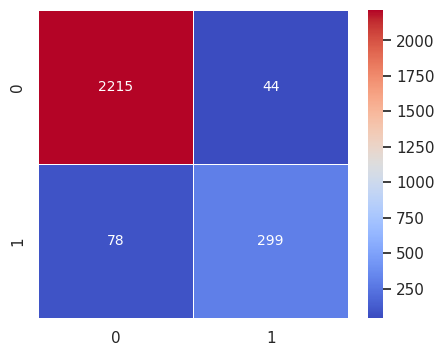



Classification binaire de la profession: 18
Profession: 18
0.9429119644299384 0.8971132784530713 0.9887106504068055
2
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2014
           1       0.86      0.78      0.82       245

    accuracy                           0.96      2259
   macro avg       0.92      0.88      0.90      2259
weighted avg       0.96      0.96      0.96      2259



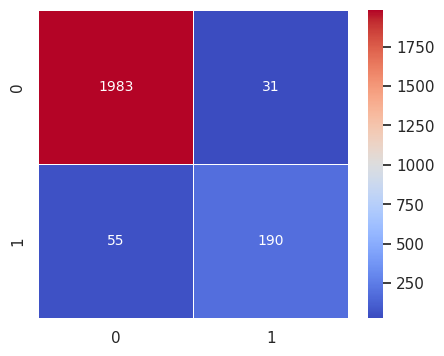



Classification binaire de la profession: 11
Profession: 11
0.9226647049893896 0.8529701451169053 0.9923592648618739
2
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1773
           1       0.79      0.69      0.74       241

    accuracy                           0.94      2014
   macro avg       0.88      0.83      0.85      2014
weighted avg       0.94      0.94      0.94      2014



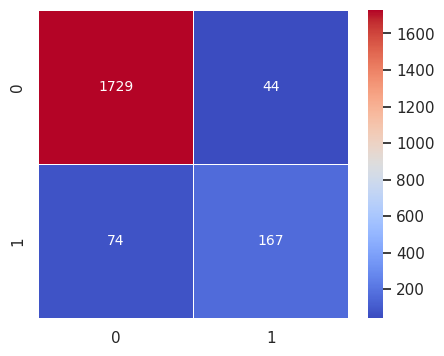



Classification binaire de la profession: 13
Profession: 13
0.920102357605237 0.8836622208715232 0.9565424943389508
2
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      1586
           1       0.81      0.77      0.79       187

    accuracy                           0.96      1773
   macro avg       0.89      0.87      0.88      1773
weighted avg       0.96      0.96      0.96      1773



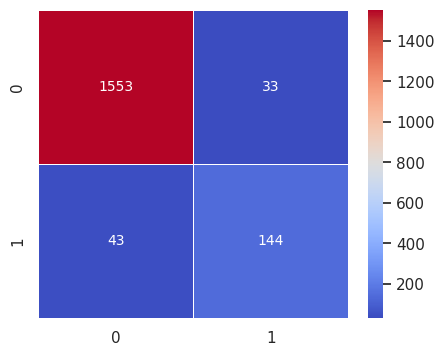



Classification binaire de la profession: 22
Profession: 22
0.8777962322081645 0.8874890042847818 0.8681034601315473
2
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1372
           1       0.85      0.77      0.80       214

    accuracy                           0.95      1586
   macro avg       0.90      0.87      0.89      1586
weighted avg       0.95      0.95      0.95      1586



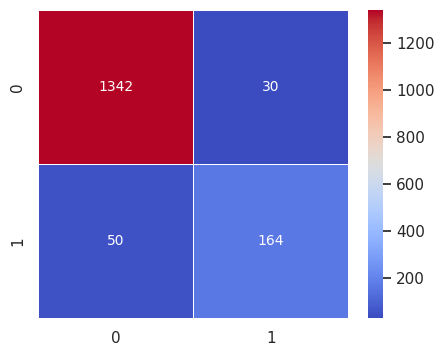



Classification binaire de la profession: 26
Profession: 26
0.8458328156262805 0.7929016268119647 0.8987640044405963
2
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1180
           1       0.73      0.57      0.64       192

    accuracy                           0.91      1372
   macro avg       0.83      0.77      0.79      1372
weighted avg       0.90      0.91      0.90      1372



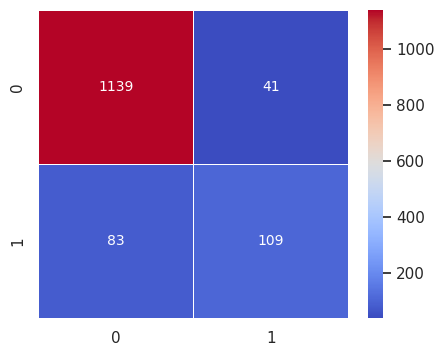



Classification binaire de la profession: 6
Profession: 6
0.9476378521773072 0.9356403169338492 0.9596353874207652
2
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1012
           1       0.89      0.89      0.89       168

    accuracy                           0.97      1180
   macro avg       0.94      0.93      0.94      1180
weighted avg       0.97      0.97      0.97      1180



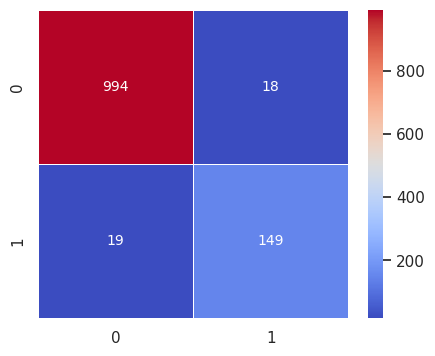



Classification binaire de la profession: 25
Profession: 25
0.9536983126907401 0.950262123197903 0.9571345021835771
2
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       869
           1       0.93      0.90      0.91       143

    accuracy                           0.98      1012
   macro avg       0.96      0.94      0.95      1012
weighted avg       0.98      0.98      0.98      1012



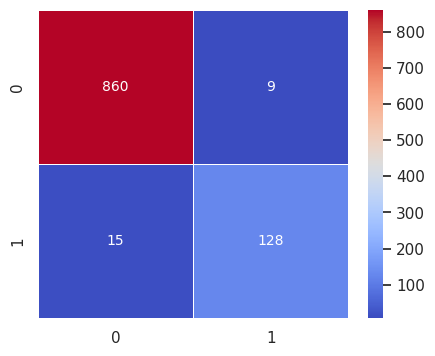



Classification binaire de la profession: 1
Profession: 1
0.9104511849059944 0.8488329317154549 0.972069438096534
2
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       746
           1       0.78      0.70      0.74       123

    accuracy                           0.93       869
   macro avg       0.87      0.83      0.85       869
weighted avg       0.93      0.93      0.93       869



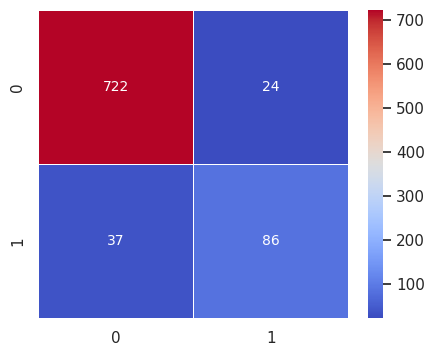



Classification binaire de la profession: 14
Profession: 14
0.9812792726282619 0.9703527074018878 0.9922058378546359
2
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       673
           1       0.92      0.97      0.95        73

    accuracy                           0.99       746
   macro avg       0.96      0.98      0.97       746
weighted avg       0.99      0.99      0.99       746



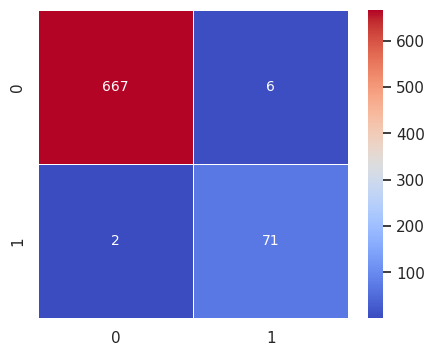



Classification binaire de la profession: 12
Profession: 12
0.8042263712361087 0.9009944686359892 0.7074582738362283
2
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       583
           1       0.86      0.80      0.83        90

    accuracy                           0.96       673
   macro avg       0.91      0.89      0.90       673
weighted avg       0.95      0.96      0.95       673



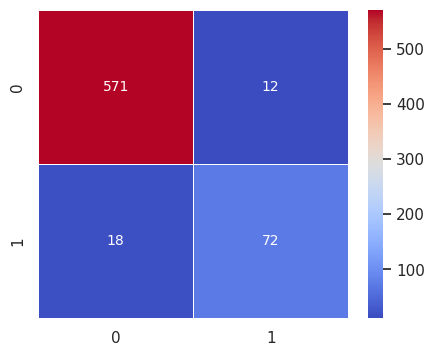



Classification binaire de la profession: 20
Profession: 20
0.9557322550176 0.9531596675010043 0.9583048425341957
2
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       501
           1       0.94      0.90      0.92        82

    accuracy                           0.98       583
   macro avg       0.96      0.95      0.95       583
weighted avg       0.98      0.98      0.98       583



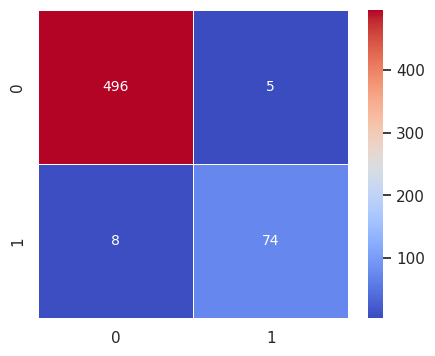



Classification binaire de la profession: 9
Profession: 9
0.9569896448070876 0.9475878163601981 0.9663914732539772
2
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       425
           1       0.96      0.87      0.91        76

    accuracy                           0.97       501
   macro avg       0.97      0.93      0.95       501
weighted avg       0.97      0.97      0.97       501



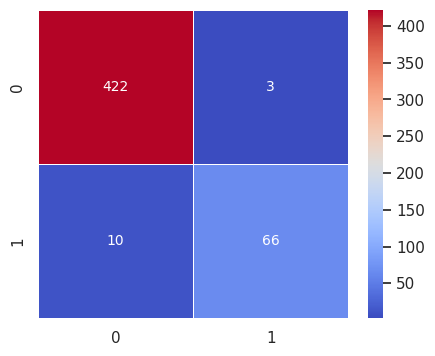



Classification binaire de la profession: 24
Profession: 24
0.9163299224682372 0.9387254901960784 0.893934354740396
2
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       353
           1       0.95      0.85      0.90        72

    accuracy                           0.97       425
   macro avg       0.96      0.92      0.94       425
weighted avg       0.97      0.97      0.97       425



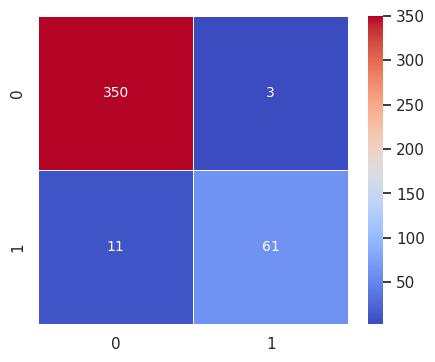



Classification binaire de la profession: 0
Profession: 0
0.9096198708837908 0.8816047471620228 0.9376349946055589
2
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       285
           1       0.81      0.81      0.81        68

    accuracy                           0.93       353
   macro avg       0.88      0.88      0.88       353
weighted avg       0.93      0.93      0.93       353



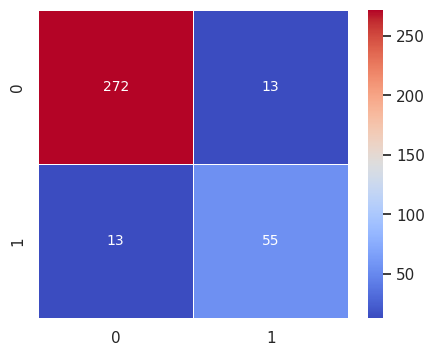



Classification binaire de la profession: 5
Profession: 5
0.9497641430189898 0.9632792799425721 0.9362490060954076
2
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       223
           1       0.97      0.92      0.94        62

    accuracy                           0.98       285
   macro avg       0.97      0.96      0.96       285
weighted avg       0.98      0.98      0.98       285



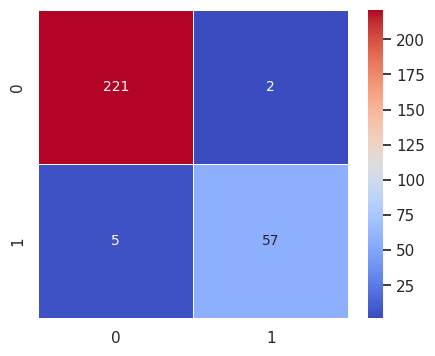



Classification binaire de la profession: 7
Profession: 7
0.8340985094716068 0.9413708920187793 0.7268261269244343
2
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       186
           1       0.94      0.86      0.90        37

    accuracy                           0.97       223
   macro avg       0.96      0.93      0.94       223
weighted avg       0.97      0.97      0.97       223



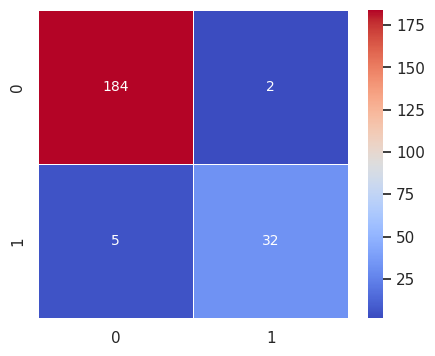



Classification binaire de la profession: 4
Profession: 4
0.9024085111851522 0.9313689315270677 0.8734480908432367
2
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       155
           1       0.90      0.87      0.89        31

    accuracy                           0.96       186
   macro avg       0.94      0.93      0.93       186
weighted avg       0.96      0.96      0.96       186



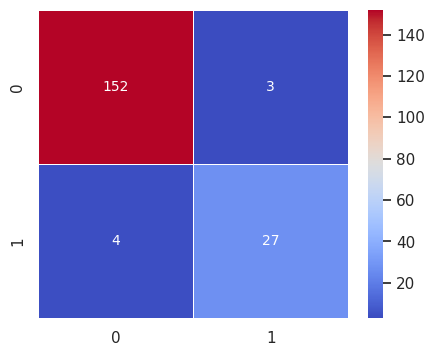



Classification binaire de la profession: 3
Profession: 3
0.8513428158719275 0.9285667259200737 0.7741189058237813
2
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       121
           1       1.00      0.79      0.89        34

    accuracy                           0.95       155
   macro avg       0.97      0.90      0.93       155
weighted avg       0.96      0.95      0.95       155



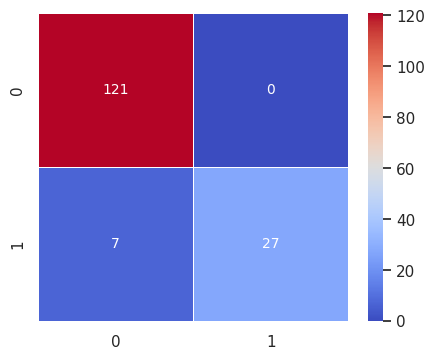



Classification binaire de la profession: 16
Profession: 16
0.9743892040801188 0.9627348321527563 0.986043576007481
2
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        94
           1       1.00      0.89      0.94        27

    accuracy                           0.98       121
   macro avg       0.98      0.94      0.96       121
weighted avg       0.98      0.98      0.97       121



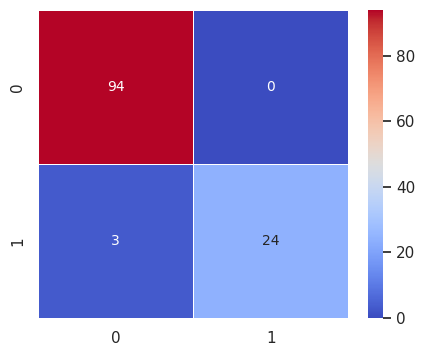



Classification binaire de la profession: 15
Profession: 15
0.9268797460072024 0.9547714514835606 0.8989880405308441
2
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        71
           1       1.00      0.87      0.93        23

    accuracy                           0.97        94
   macro avg       0.98      0.93      0.95        94
weighted avg       0.97      0.97      0.97        94



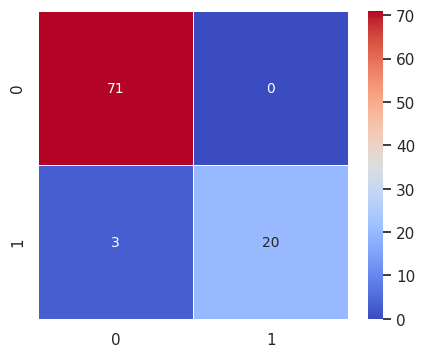



Classification binaire de la profession: 27
Profession: 27
0.9140981327312937 0.9226579520697167 0.9055383133928707
2
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        54
           1       0.88      0.88      0.88        17

    accuracy                           0.94        71
   macro avg       0.92      0.92      0.92        71
weighted avg       0.94      0.94      0.94        71



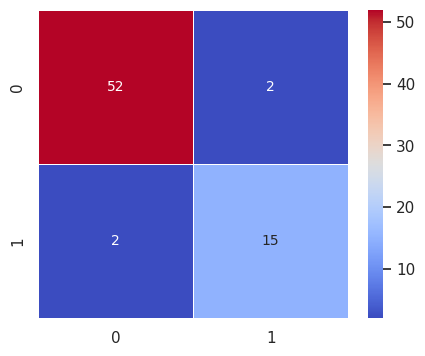



Classification binaire de la profession: 8
Profession: 8
0.9174697811869363 0.9345454545454545 0.9003941078284183
2
              precision    recall  f1-score   support

           0       0.95      0.97      0.96        37
           1       0.94      0.88      0.91        17

    accuracy                           0.94        54
   macro avg       0.94      0.93      0.93        54
weighted avg       0.94      0.94      0.94        54



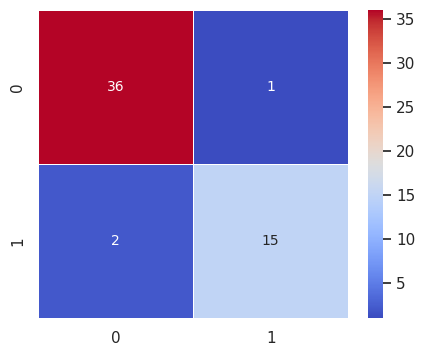



Classification binaire de la profession: 17
Profession: 17
0.8187086965655137 0.9202586206896552 0.7171587724413722
2
              precision    recall  f1-score   support

           0       0.93      1.00      0.97        28
           1       1.00      0.78      0.88         9

    accuracy                           0.95        37
   macro avg       0.97      0.89      0.92        37
weighted avg       0.95      0.95      0.94        37



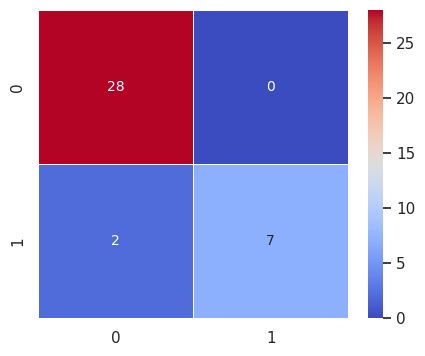



Classification binaire de la profession: 10
Profession: 10
0.9594609321702209 0.9631093544137023 0.9558125099267395
2
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        11
           1       1.00      0.94      0.97        17

    accuracy                           0.96        28
   macro avg       0.96      0.97      0.96        28
weighted avg       0.97      0.96      0.96        28



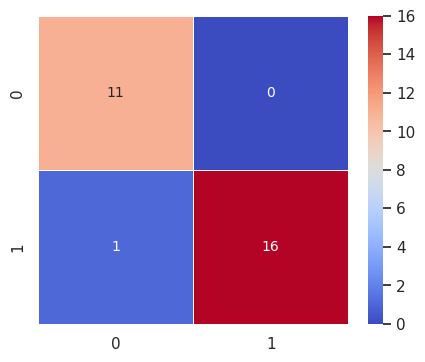

In [26]:
X = dat['X_train']
Y = dat['Y']
S = dat['S_train']

# Séparation des données pour l'entraînement des modèles
# test final pour évaluer la perfo de l'algo complet
X_train, X_test_final, Y_train, Y_test_final, S_train, S_test_final = train_test_split(X, Y, S, test_size=0.2, random_state=42)
# test pour évaluer la perfo des modèles
X_train, X_test, Y_train, Y_test, S_train, S_test = train_test_split(X_train, Y_train, S_train, test_size=0.2, random_state=42)


clf_list = []
performance = []

for i in labels_tries[:-1]:
    
    print(f"Classification binaire de la profession: {i}")
    
    # copie des données
    Y_train_temp = Y_train.copy()
    Y_test_temp = Y_test.copy()
    
    # binarisation des labels
    Y_train_temp[Y_train == i] = 1
    Y_train_temp[Y_train != i] = 0
    Y_test_temp[Y_test == i] = 1
    Y_test_temp[Y_test != i] = 0
    
    # entrainement du modèle
    clf = LogisticRegression(random_state=0, max_iter=5000).fit(X_train, Y_train_temp)
    
    # prédiction
    Y_pred = clf.predict(X_test)
    
    # évaluation
    print(f"Profession: {i}")
    eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred, Y_test_temp, S_test, metrics=['TPR'])
    final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
    print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))
    performance.append(final_score)

    names = [str(x) for x in set(Y_test_temp)]
    print(len(names))
    print(classification_report(Y_test_temp, Y_pred, target_names=names))

    cm = confusion_matrix(Y_test_temp, Y_pred)
    df_cm = pd.DataFrame(cm, index=names, columns=names)
    plt.figure(figsize=(5,4))
    sn.set(font_scale=1)
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
    plt.show()
    print("\n")
    
    # sauvegarde du modèle
    clf_list.append(clf)
    
    # suppression de la classe i
    X_train = X_train[Y_train != i]
    S_train = S_train[Y_train != i]
    Y_train = Y_train[Y_train != i]
    X_test = X_test[Y_test != i]
    S_test = S_test[Y_test != i]
    Y_test = Y_test[Y_test != i]
    
    

In [27]:
# Préparation des données
Y_train_binary = np.where(Y_train == 21, 1, 0)
Y_test_inter_binary = np.where(Y_test_inter == 21, 1, 0)
Y_test_final_binary = np.where(Y_test_final == 21, 1, 0)

NameError: name 'Y_test_inter' is not defined

In [ ]:
# Entraîner le classifieur binaire
clf_bin = LogisticRegression()
clf_bin.fit(X_train, Y_train_binary)

# Prédire les étiquettes pour les données de test
Y_pred_binary = clf_bin.predict(X_test_inter)


c:\Users\edoua\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9458126376359197 0.8993139190670238 0.9923113562048157
2
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3108
           1       0.87      0.85      0.86      1332

    accuracy                           0.92      4440
   macro avg       0.90      0.90      0.90      4440
weighted avg       0.92      0.92      0.92      4440



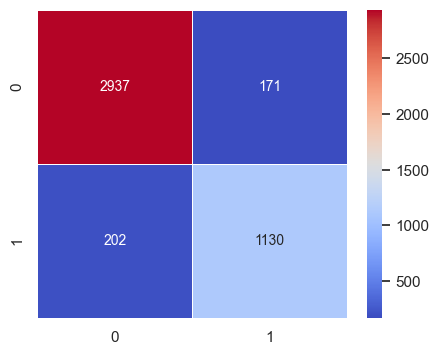

In [ ]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred_binary, Y_test_inter_binary, S_test_inter, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))

names = [str(x) for x in set(Y_test_inter_binary)]
print(len(names))
print(classification_report(Y_test_inter_binary, Y_pred_binary, target_names=names))

cm = confusion_matrix(Y_test_inter_binary, Y_pred_binary)
df_cm = pd.DataFrame(cm, index=names, columns=names)
# config plot sizes
plt.figure(figsize=(5,4))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

## Classifieur multiclasse

In [ ]:
#Suppression de la classe 21
X_train_wo_21 = X_train[Y_train != 21]
S_train_wo_21 = S_train[Y_train != 21]
Y_train_wo_21 = Y_train[Y_train != 21]

X_test_inter_wo_21 = X_test_inter[Y_test_inter != 21]
S_test_inter_wo_21 = S_test_inter[Y_test_inter != 21]
Y_test_inter_wo_21 = Y_test_inter[Y_test_inter != 21]

print(np.unique(Y_train_wo_21))
print(np.unique(Y_test_inter_wo_21))

# #Suppression de la classe 19
# X = X[Y != 19]
# S = S[Y != 19]
# Y = Y[Y != 19]

# print(np.unique(Y))

# #Suppression de la classe 2
# X = X[Y != 2]
# S = S[Y != 2]
# Y = Y[Y != 2]

# print(np.unique(Y))

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24
 25 26 27]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24
 25 26 27]


In [ ]:
# Entraîner le classifieur multiclasse
clf_multi = LogisticRegression(random_state=0, max_iter=5000).fit(X_train_wo_21, Y_train_wo_21)

# Prédire les étiquettes pour les données de test
Y_pred_multi = clf_multi.predict(X_test_inter_wo_21)

0.7044778191424923 0.690558477274187 0.7183971610107975
27
              precision    recall  f1-score   support

           0       0.63      0.66      0.65        68
           1       0.69      0.66      0.68       123
           2       0.87      0.83      0.85       377
           3       0.60      0.26      0.37        34
           4       0.79      0.74      0.77        31
           5       0.79      0.85      0.82        62
           6       0.89      0.86      0.88       168
           7       0.71      0.68      0.69        37
           8       0.78      0.82      0.80        17
           9       0.76      0.75      0.75        76
          10       0.77      0.59      0.67        17
          11       0.72      0.76      0.74       241
          12       0.68      0.72      0.70        90
          13       0.71      0.76      0.73       187
          14       0.70      0.85      0.77        73
          15       0.42      0.22      0.29        23
          16       0.5

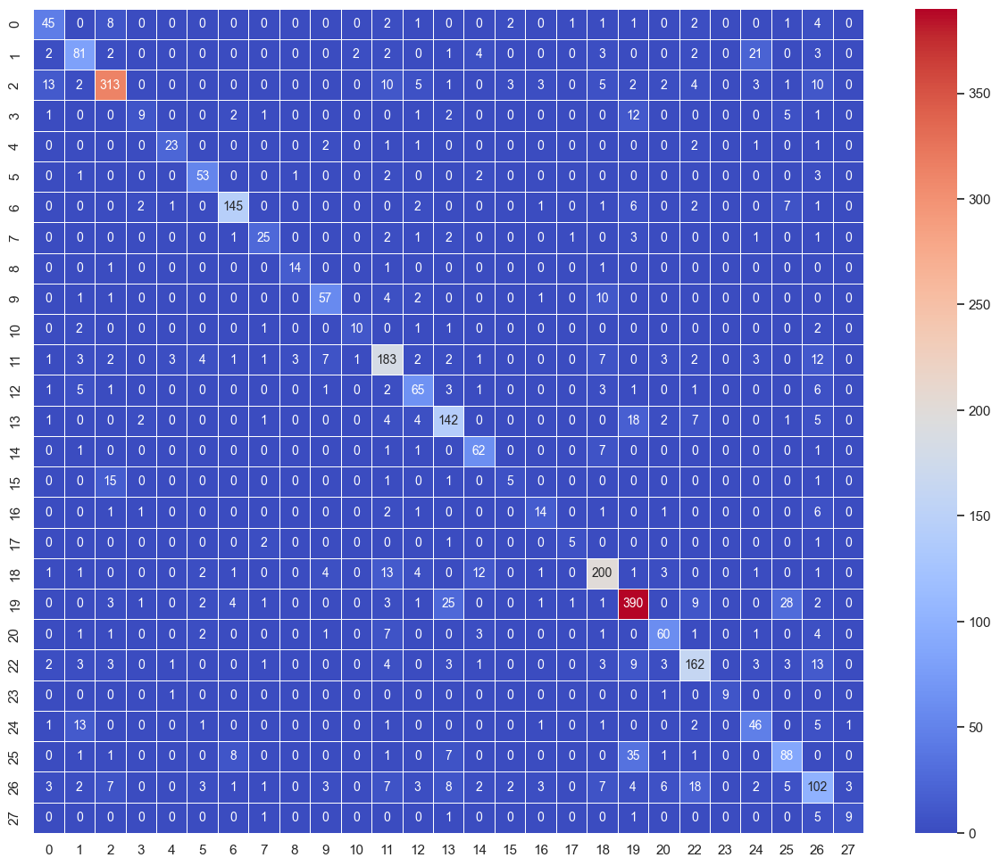

In [ ]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred_multi, Y_test_inter_wo_21, S_test_inter_wo_21, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))

names = [str(x) for x in set(Y_test_inter_wo_21)]
print(len(names))
print(classification_report(Y_test_inter_wo_21, Y_pred_multi, target_names=names))

cm = confusion_matrix(Y_test_inter_wo_21, Y_pred_multi)
df_cm = pd.DataFrame(cm, index=names, columns=names)
# config plot sizes
plt.figure(figsize=(15,12))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

In [ ]:
Y_pred_final_bin = clf_bin.predict(X_test_final)


0.9458134375082482 0.9008414369692024 0.990785438047294
2
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      3914
           1       0.87      0.85      0.86      1636

    accuracy                           0.92      5550
   macro avg       0.90      0.90      0.90      5550
weighted avg       0.92      0.92      0.92      5550



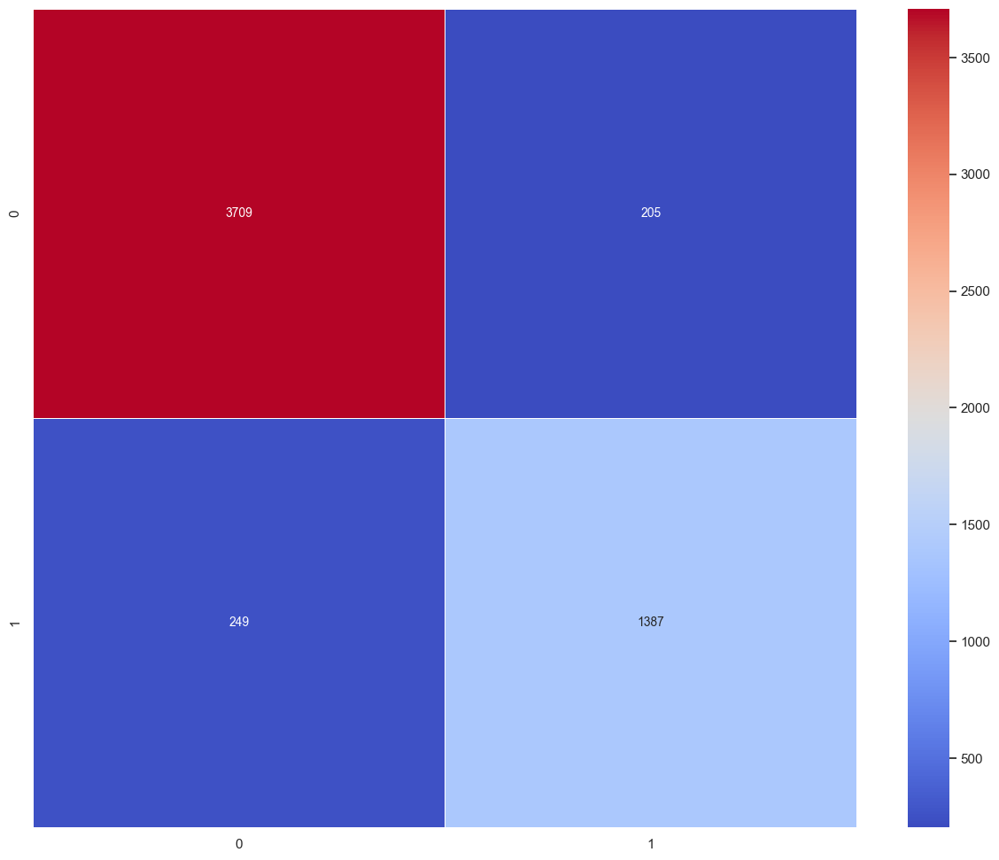

In [ ]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred_final_bin, Y_test_final_binary, S_test_final, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))

names = [str(x) for x in set(Y_test_final_binary)]
print(len(names))
print(classification_report(Y_test_final_binary, Y_pred_final_bin, target_names=names))

cm = confusion_matrix(Y_test_final_binary, Y_pred_final_bin)
df_cm = pd.DataFrame(cm, index=names, columns=names)
# config plot sizes
plt.figure(figsize=(15,12))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

In [ ]:
X_multi_final = X_test_final[Y_pred_final_bin == 0]
Y_multi_final = Y_test_final[Y_pred_final_bin == 0]
S_multi_final = S_test_final[Y_pred_final_bin == 0]

Y_pred_final_multi = clf_multi.predict(X_multi_final)

print(Y_multi_final.value_counts().get(21, 0))
print(X_multi_final.shape)
print(Y_multi_final.shape)
print(S_multi_final.shape)


249
(3958, 768)
(3958,)
(3958,)


0.7044251303034502 0.657626454332483 0.7512238062744174
28
              precision    recall  f1-score   support

           0       0.64      0.61      0.63        80
           1       0.64      0.68      0.66       114
           2       0.82      0.87      0.84       448
           3       0.69      0.31      0.42        36
           4       0.87      0.56      0.68        48
           5       0.79      0.85      0.82        66
           6       0.86      0.85      0.85       178
           7       0.85      0.77      0.81        53
           8       0.74      0.78      0.76        18
           9       0.74      0.79      0.77        91
          10       0.77      0.45      0.57        22
          11       0.65      0.74      0.69       273
          12       0.71      0.68      0.69       109
          13       0.71      0.82      0.76       253
          14       0.76      0.67      0.71       111
          15       0.54      0.37      0.44        19
          16       0.4

c:\Users\edoua\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\edoua\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\edoua\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

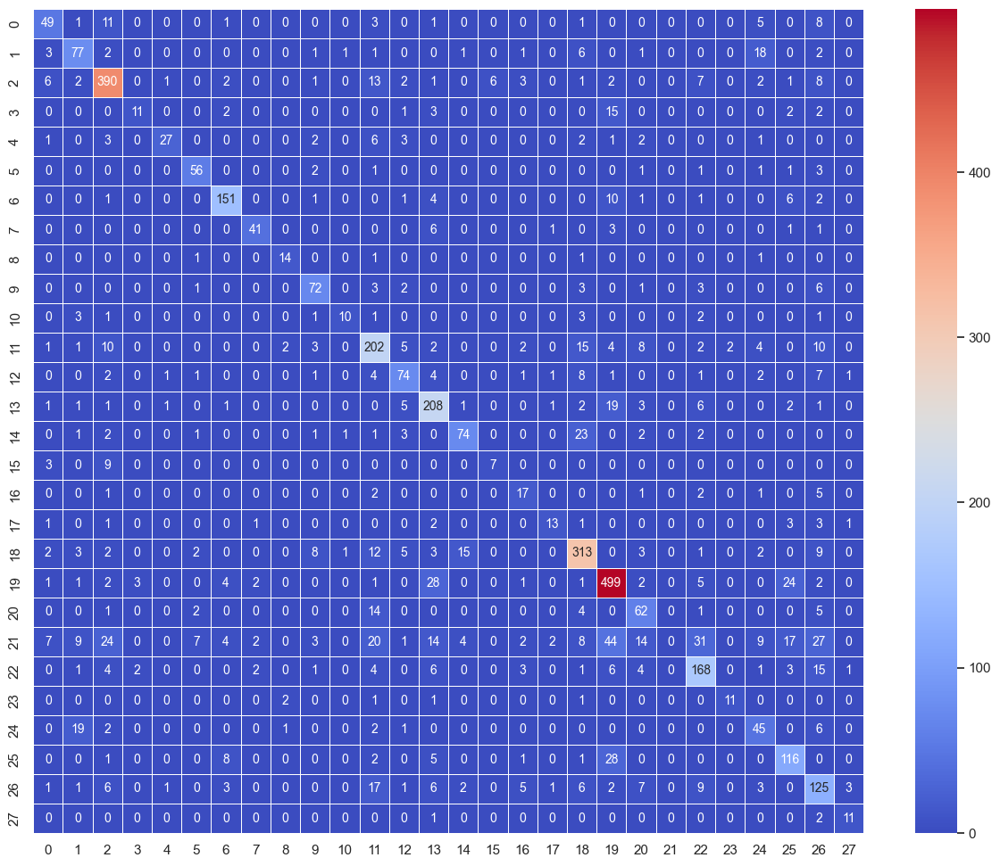

In [ ]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred_final_multi, Y_multi_final, S_multi_final, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))

names = [str(x) for x in set(Y_multi_final)]
print(len(names))
print(classification_report(Y_multi_final, Y_pred_final_multi, target_names=names))

cm = confusion_matrix(Y_multi_final, Y_pred_final_multi)
df_cm = pd.DataFrame(cm, index=names, columns=names)
# config plot sizes
plt.figure(figsize=(15,12))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

In [ ]:

Y_pred_final_bin[Y_pred_final_bin == 1] = 21
Y_pred_final_bin[Y_pred_final_bin == 0] = Y_pred_final_multi



NameError: name 'Y_pred_final_bin' is not defined

In [ ]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred_final_bin, Y_test_final, S_test_final, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score, eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))

names = [str(x) for x in set(Y_test_final)]
print(len(names))
print(classification_report(Y_test_final, Y_pred_final_bin, target_names=names))

cm = confusion_matrix(Y_test_final, Y_pred_final_bin)
df_cm = pd.DataFrame(cm, index=names, columns=names)
# config plot sizes
plt.figure(figsize=(15,12))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

NameError: name 'Y_pred_final_bin' is not defined

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

data = np.column_stack((X_train, S_train))
under_sampler = RandomUnderSampler(random_state=42)
data, Y_train = under_sampler.fit_resample(data, Y_train)

X_train = data[:, :-1]
S_train = data[:, -1].astype(int) 

# Initialiser un dictionnaire pour stocker les comptes de chaque profession pour chaque genre
counts_by_profession = {}

# Compter le nombre de valeurs par profession et par genre
for profession, genre in zip(Y_train, S_train):
    if profession not in counts_by_profession:
        counts_by_profession[profession] = [0, 0]  # Initialiser le compteur pour cette profession
    counts_by_profession[profession][genre] += 1  # Incrémenter le compteur correspondant au genre

# Trier la liste des professions par classe de profession
sorted_counts_by_profession = sorted(counts_by_profession.items(), key=lambda x: x[0])

# Tracer l'histogramme des professions avec la répartition des genres
plt.figure(figsize=(12, 6))
for profession, counts in sorted_counts_by_profession:
    plt.bar(profession, counts[0], color='blue', label='Genre 0')
    plt.bar(profession, counts[1], bottom=counts[0], color='orange', label='Genre 1')

plt.title('Répartition des genres par profession')
plt.xlabel('Profession')
plt.ylabel('Nombre de personnes')
plt.legend(['Genre 0', 'Genre 1'])
plt.xticks(range(28))
plt.tight_layout()
plt.show()

ModuleNotFoundError: No module named 'imblearn'

In [ ]:
# # Initialiser un dictionnaire pour stocker les comptes de chaque profession pour chaque genre
# counts_by_profession = {}

# # Compter le nombre de valeurs par profession et par genre
# for profession, genre in zip(Y_train, S_train):
#     if profession not in counts_by_profession:
#         counts_by_profession[profession] = [0, 0]  # Initialiser le compteur pour cette profession
#     counts_by_profession[profession][genre] += 1  # Incrémenter le compteur correspondant au genre

# # Trier la liste des professions par classe de profession
# sorted_counts_by_profession = sorted(counts_by_profession.items(), key=lambda x: x[0])

# # Tracer l'histogramme des professions avec la répartition des genres
# plt.figure(figsize=(12, 6))
# for profession, counts in sorted_counts_by_profession:
#     plt.bar(profession, counts[0], color='blue', label='Genre 0')
#     plt.bar(profession, counts[1], bottom=counts[0], color='orange', label='Genre 1')

# plt.title('X_train: Répartition des genres par profession')
# plt.xlabel('Profession')
# plt.ylabel('Nombre de personnes')
# plt.legend(['Genre 0', 'Genre 1'])
# plt.xticks(range(28))
# plt.tight_layout()
# plt.show()

# # Initialiser un dictionnaire pour stocker les comptes de chaque profession pour chaque genre
# counts_by_profession = {}

# # Compter le nombre de valeurs par profession et par genre
# for profession, genre in zip(Y_test, S_test):
#     if profession not in counts_by_profession:
#         counts_by_profession[profession] = [0, 0]  # Initialiser le compteur pour cette profession
#     counts_by_profession[profession][genre] += 1  # Incrémenter le compteur correspondant au genre

# # Trier la liste des professions par classe de profession
# sorted_counts_by_profession = sorted(counts_by_profession.items(), key=lambda x: x[0])
     
# # Tracer l'histogramme des professions avec la répartition des genres
# plt.figure(figsize=(12, 6))
# for profession, counts in sorted_counts_by_profession:
#     plt.bar(profession, counts[0], color='blue', label='Genre 0')
#     plt.bar(profession, counts[1], bottom=counts[0], color='orange', label='Genre 1')

# plt.title('X_test: Répartition des genres par profession')
# plt.xlabel('Profession')
# plt.ylabel('Nombre de personnes')
# plt.legend(['Genre 0', 'Genre 1'])
# plt.xticks(range(28))
# plt.tight_layout()
# plt.show()
        

In [ ]:
import random

# Get all indices where the class is 21
indices_21 = Y_train[Y_train == 21].index.tolist()

# Choose 3000 random indices
random_indices = random.sample(indices_21, k=3000)

# Remove the chosen indices from X, Y, and S
Xr = X_train.drop(index=random_indices)
Yr = Y_train.drop(index=random_indices)
Sr = S_train.drop(index=random_indices)



In [ ]:
# Initialiser un dictionnaire pour stocker les comptes de chaque profession pour chaque genre
counts_by_profession = {}

# Compter le nombre de valeurs par profession et par genre
for profession, genre in zip(Yr, Sr):
    if profession not in counts_by_profession:
        counts_by_profession[profession] = [0, 0]  # Initialiser le compteur pour cette profession
    counts_by_profession[profession][genre] += 1  # Incrémenter le compteur correspondant au genre

# Trier la liste des professions par classe de profession
sorted_counts_by_profession = sorted(counts_by_profession.items(), key=lambda x: x[0])

# Afficher le nombre de valeurs par profession et par genre
print("Distribution des professions et genres [0, 1]:")
print("En \033[91mrouge\033[0m les distributions de genre dont le déséquilibre dépasse les 70/30")
for profession, counts in sorted_counts_by_profession:
    if counts[0]/(counts[0]+counts[1]) >= 0.3 and counts[0]/(counts[0]+counts[1]) <= 0.7:
        print(f"Profession {profession}: {counts[0]+counts[1]} [{counts[0]}, {counts[1]}]")
    else:
        print(f"Profession {profession}: {counts[0]+counts[1]} [\033[91m{counts[0]}\033[0m, \033[91m{counts[1]}\033[0m]")
        

Distribution des professions et genres [0, 1]:
En rouge les distributions de genre dont le déséquilibre dépasse les 70/30
Profession 0: 238 [143, 95]
Profession 1: 453 [345, 108]
Profession 2: 1438 [856, 582]
Profession 3: 114 [83, 31]
Profession 4: 127 [99, 28]
Profession 5: 252 [210, 42]
Profession 6: 648 [435, 213]
Profession 7: 171 [14, 157]
Profession 8: 72 [60, 12]
Profession 9: 332 [224, 108]
Profession 10: 54 [5, 49]
Profession 11: 875 [446, 429]
Profession 12: 324 [50, 274]
Profession 13: 871 [86, 785]
Profession 14: 357 [179, 178]
Profession 15: 94 [15, 79]
Profession 16: 118 [88, 30]
Profession 17: 62 [35, 27]
Profession 18: 1087 [712, 375]
Profession 19: 1835 [937, 898]
Profession 20: 324 [169, 155]
Profession 21: 2317 [1271, 1046]
Profession 22: 817 [314, 503]
Profession 23: 65 [60, 5]
Profession 24: 306 [262, 44]
Profession 25: 622 [536, 86]
Profession 26: 702 [279, 423]
Profession 27: 84 [17, 67]


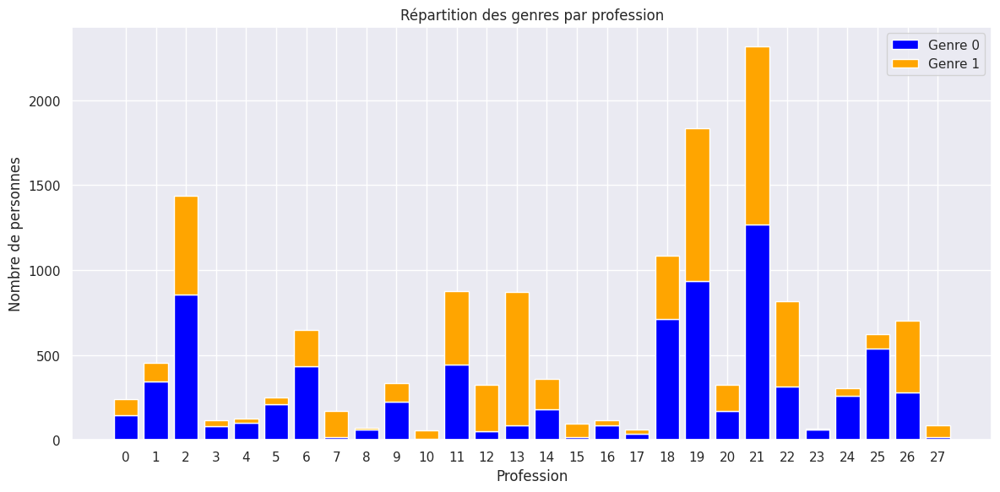

In [ ]:
# Tracer l'histogramme des professions avec la répartition des genres
plt.figure(figsize=(12, 6))
for profession, counts in sorted_counts_by_profession:
    plt.bar(profession, counts[0], color='blue', label='Genre 0')
    plt.bar(profession, counts[1], bottom=counts[0], color='orange', label='Genre 1')

plt.title('Répartition des genres par profession')
plt.xlabel('Profession')
plt.ylabel('Nombre de personnes')
plt.legend(['Genre 0', 'Genre 1'])
plt.xticks(range(28))
plt.tight_layout()
plt.show()

In [ ]:
from imblearn.over_sampling import SMOTE
import numpy as np

X_train_0 = []
Y_train_0 = []
S_train_0 = []
X_train_1 = []
Y_train_1 = []
S_train_1 = []

for i, s in enumerate(Sr):
    if s == 0:
        X_train_0.append(Xr.iloc[i])
        Y_train_0.append(Yr.iloc[i])
    elif s == 1:
        X_train_1.append(Xr.iloc[i])
        Y_train_1.append(Yr.iloc[i])
    else:
        print(f"Erreur: genre inconnu {s}")
        
X_train_0 = np.array(X_train_0)
Y_train_0 = pd.Series(Y_train_0)
S_train_0 = np.zeros(len(X_train_0))
X_train_1 = np.array(X_train_1)
Y_train_1 = pd.Series(Y_train_1)
S_train_1 = np.ones(len(X_train_1))

smote_strat_0 = {}
smote_strat_1 = {}
param_strat = 0.7
for i in range(28):
    smote_strat_0[i] = int(Y_train_0.value_counts()[i] * param_strat + Y_train_0.value_counts()[21] * (1-param_strat))
    smote_strat_1[i] = int(Y_train_1.value_counts()[i] * param_strat + Y_train_1.value_counts()[21] * (1-param_strat))

print(smote_strat_0)
print(smote_strat_1)
    
     
smote_0 = SMOTE(random_state=42, k_neighbors=5, sampling_strategy=smote_strat_0)
X_train_0_resampled, Y_train_0_resampled = smote_0.fit_resample(X_train_0, Y_train_0)
S_train_0_resampled = np.zeros(len(X_train_0_resampled))
smote_1 = SMOTE(random_state=42, k_neighbors=5, sampling_strategy=smote_strat_1)
X_train_1_resampled, Y_train_1_resampled = smote_1.fit_resample(X_train_1, Y_train_1)
S_train_1_resampled = np.ones(len(X_train_1_resampled))

X_train_resampled = np.concatenate((X_train_0_resampled, X_train_1_resampled))
Y_train_resampled = np.concatenate((Y_train_0_resampled, Y_train_1_resampled))
S_train_resampled = np.concatenate((S_train_0_resampled, S_train_1_resampled))

# Shuffle the arrays
indices = np.arange(len(X_train_resampled))
np.random.shuffle(indices)

X_train_resampled_shuffled = pd.DataFrame(X_train_resampled[indices])
Y_train_resampled_shuffled = pd.Series(Y_train_resampled[indices])
S_train_resampled_shuffled = pd.Series(S_train_resampled[indices])

print(X_train_resampled_shuffled.shape)

# Initialiser un dictionnaire pour stocker les comptes de chaque profession pour chaque genre
counts_by_profession = {}

# Compter le nombre de valeurs par profession et par genre
for profession, genre in zip(Y_train_resampled_shuffled, S_train_resampled_shuffled):
    if profession not in counts_by_profession:
        counts_by_profession[profession] = [0, 0]  # Initialiser le compteur pour cette profession
    counts_by_profession[profession][int(genre)] += 1  # Incrémenter le compteur correspondant au genre

# Trier la liste des professions par classe de profession
sorted_counts_by_profession = sorted(counts_by_profession.items(), key=lambda x: x[0])

# Tracer l'histogramme des professions avec la répartition des genres
plt.figure(figsize=(12, 6))
for profession, counts in sorted_counts_by_profession:
    plt.bar(profession, counts[0], color='blue', label='Genre 0')
    plt.bar(profession, counts[1], bottom=counts[0], color='orange', label='Genre 1')

plt.title('X_test: Répartition des genres par profession')
plt.xlabel('Profession')
plt.ylabel('Nombre de personnes')
plt.legend(['Genre 0', 'Genre 1'])
plt.xticks(range(28))
plt.tight_layout()
plt.show()

ModuleNotFoundError: No module named 'imblearn'

In [ ]:
t = time.time()
# Train the logistic regression
# X_train, X_test, Y_train, Y_test, S_train, S_test = train_test_split(X, Y, S, test_size=0.3, random_state=42)
clf = LogisticRegression(random_state=0, max_iter=5000).fit(X_train, Y_train)
print(time.time() - t)

26.15028214454651


In [ ]:
# X_test_pca = pca.transform(X_test)
Y_pred = clf.predict(X_test)
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred, Y_test, S_test, metrics=['TPR'])

In [ ]:
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(final_score)

0.7402638152345984


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sn
import matplotlib.pyplot as plt
print(eval_scores['macro_fscore'], (1-eval_scores['TPR_GAP']))
names = [str(x) for x in set(Y_test)]
print(len(names))
print(classification_report(Y_test, Y_pred, target_names=names))

0.5727693927841807 0.7174628130159731
28
              precision    recall  f1-score   support

           0       0.42      0.68      0.52        81
           1       0.43      0.52      0.47       127
           2       0.83      0.64      0.72       458
           3       0.20      0.64      0.31        36
           4       0.49      0.77      0.60        48
           5       0.69      0.85      0.76        72
           6       0.79      0.70      0.74       178
           7       0.46      0.70      0.55        54
           8       0.36      0.78      0.49        18
           9       0.64      0.79      0.71        91
          10       0.21      0.68      0.32        22
          11       0.61      0.65      0.63       286
          12       0.70      0.69      0.69       110
          13       0.64      0.76      0.70       258
          14       0.68      0.79      0.73       112
          15       0.11      0.79      0.20        19
          16       0.25      0.88      0

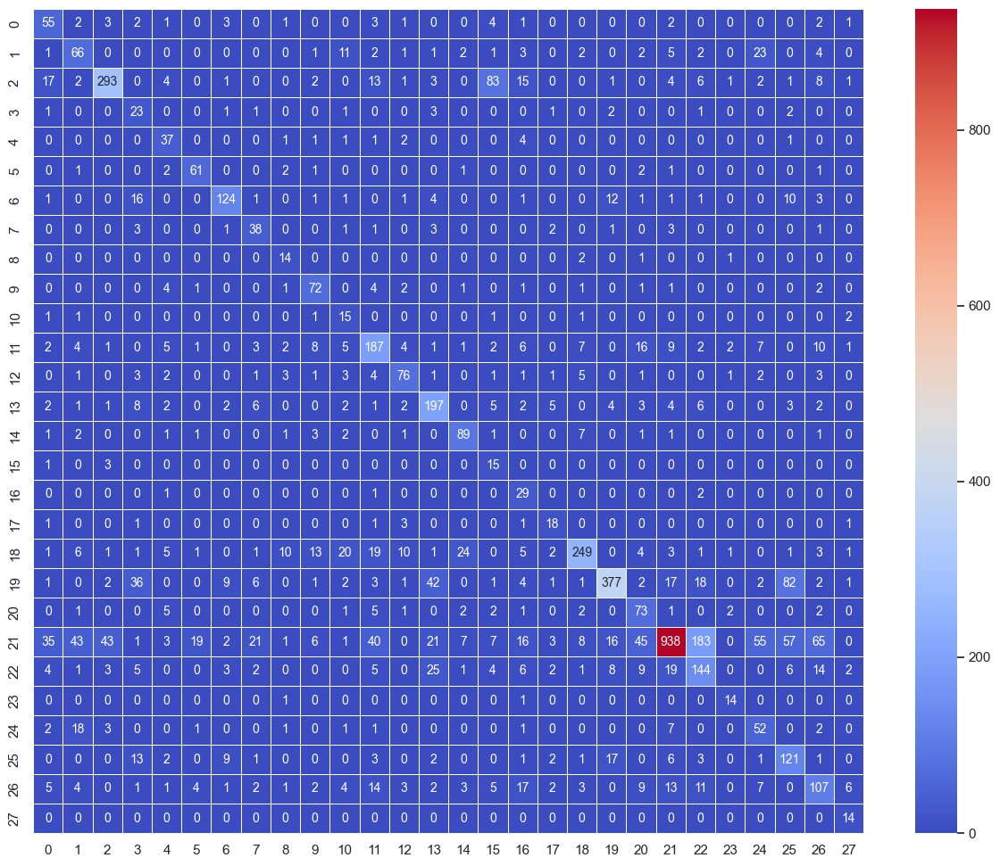

In [ ]:
cm = confusion_matrix(Y_test, Y_pred)
df_cm = pd.DataFrame(cm, index=names, columns=names)
# config plot sizes
plt.figure(figsize=(15,12))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap='coolwarm', linewidth=0.5, fmt="")
plt.show()

In [ ]:
# Load the "true" test data
X_test = dat['X_test']
S_test = dat['S_test'] 
# Classify the provided test data with you classifier
y_test = clf.predict(X_test)
results=pd.DataFrame(y_test, columns= ['score'])

results.to_csv("Data_Challenge_MDI_341.csv", header = None, index = None)
# np.savetxt('y_test_challenge_student.txt', y_test, delimiter=',')

NameError: name 'clf' is not defined

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sn
import matplotlib.pyplot as plt

# Créer un classificateur Gradient Boosting
gb_classifier = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Créer un classificateur Random Forest
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Entraîner le classificateur
# gb_classifier.fit(X_train, Y_train)
rf_classifier.fit(X_train, Y_train)

# Faire des prédictions sur l'ensemble de test
# Y_pred = gb_classifier.predict(X_test)
Y_pred = rf_classifier.predict(X_test)

# Évaluer les performances du modèle
print(classification_report(Y_test, Y_pred))

ValueError: Found input variables with inconsistent numbers of samples: [4440, 11893]

In [ ]:
eval_scores, confusion_matrices_eval = gap_eval_scores(Y_pred, Y_test, S_test, metrics=['TPR'])
final_score = (eval_scores['macro_fscore']+ (1-eval_scores['TPR_GAP']))/2
print(eval_scores['macro_fscore'], 1-eval_scores['TPR_GAP'], final_score)


0.3780486831079997 0.8188490610226774 0.5984488720653386


In [ ]:

# Load the "true" test data
X_test_true = dat['X_test']
S_test_true = dat['S_test'] 
# Classify the provided test data with you classifier
Y_test_true = gb_classifier.predict(X_test_true)
results=pd.DataFrame(y_test, columns= ['score'])

results.to_csv("Data_Challenge_MDI_341_GBC.csv", header = None, index = None)
# np.savetxt('y_test_challenge_student.txt', y_test, delimiter=',')

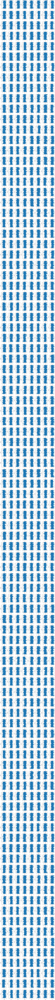

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Définir le nombre de graphiques par ligne
graphs_per_row = 8

# Calculer le nombre total de lignes
num_rows = (X_train.shape[1] + graphs_per_row - 1) // graphs_per_row

# Créer une figure et des sous-plots
fig, axes = plt.subplots(num_rows, graphs_per_row, figsize=(16, 3*num_rows))

# Parcourir chaque feature
for feature_index, feature_name in enumerate(X_train.columns):
    row_index = feature_index // graphs_per_row
    col_index = feature_index % graphs_per_row

    # Sélectionner les valeurs de la feature et de la classe correspondante
    feature_values = X_train[feature_name]
    class_values = Y_train

    # Tracer le graphique
    axes[row_index, col_index].scatter(feature_values, class_values, alpha=0.5)
    axes[row_index, col_index].set_xlabel(feature_name)
    axes[row_index, col_index].set_ylabel('Classe')

# Supprimer les sous-plots vides
for feature_index in range(len(X_train.columns), num_rows * graphs_per_row):
    row_index = feature_index // graphs_per_row
    col_index = feature_index % graphs_per_row
    fig.delaxes(axes[row_index, col_index])

# Ajuster la disposition et afficher la figure
plt.tight_layout()
plt.show()
